# Prerequisites

In [2]:
import numpy as np
import matplotlib.pyplot as pl
import numpy as np
import scanpy.api as sc
import pandas as pd
from scanpy.tools import rna_velocity
from anndata import AnnData
import seaborn as sns
from scipy.sparse import csr_matrix
import networkx as nx
import xlsxwriter
from matplotlib import rcParams
import seaborn as sns
import scipy as sci
import gseapy as gp
sc.settings.verbosity = 3
sc.logging.print_versions()

scanpy==1.3.2 anndata==0.6.10 numpy==1.15.4 scipy==1.2.1 pandas==0.23.4 scikit-learn==0.20.0 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


# Read and write data

<div class="alert alert-info">

**Note**
    
Load the processed and annotated data provided as **supplementary file** under GEO accession number **GSE132188**. The anndata object is output of the scRNA_seq_preprocessing_clustering.ipynb notebook and is obtained via multiple preprocessing, filtering and clustering steps from the raw count matrices.

</div> 

In [5]:
adata_all=sc.read('/Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/adata_all_paper.h5ad')


In [700]:
sc.write('./adata.h5ad',adata_all)

# Subset adata to highly variable genes

<div class="alert alert-info">

**Note**
    
Note that the embedding, clustering and trajectory inference were obtained using only the highly variable genes (hvg) (see scRNA_seq_preprocessing_clustering.ipynb notebook) and then copied to the full anndata object. To reproduce the trajectories below we first create the adata_hvg from the full anndata loaded. (In newer scanpy versions everything can be stored in one anndata object)
    
</div> 

In [7]:
adata_hvg=adata_all[:,adata_all.var['highly_variable_genes']].copy()

# Cell cycle score

calculate cell cycle score using the list from Tirosh et al, 2016 (see also scanpy tutorial).

In [376]:
cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes_10X.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_all.var_names]

sc.tl.score_genes_cell_cycle(adata_all, s_genes=s_genes, g2m_genes=g2m_genes)


calculating cell cycle phase
computing score 'S_score'
    finished (0:00:18.46) --> added
    'S_score', score of gene set (adata.obs)
computing score 'G2M_score'
    finished (0:00:11.92) --> added
    'G2M_score', score of gene set (adata.obs)
-->     'phase', cell cycle phase (adata.obs)


In [ ]:
adata_hvg.obs['phase'] = pd.Categorical(adata_all.obs['phase'])
ref_cluster = pd.Categorical(adata_hvg.obs['phase'],categories=['S','G2M','G1','Cycling','Non-Cycling'])
x = adata_hvg.obs['phase'] =='S'
ref_cluster[x] = 'Cycling'
x = adata_hvg.obs['phase'] =='G2M'
ref_cluster[x]='Cycling'
x = adata_hvg.obs['phase'] =='G1'
ref_cluster[x]='Non-Cycling'
adata_hvg.obs['proliferation'] = ref_cluster
adata_hvg.obs['proliferation'].cat.remove_unused_categories(inplace=True)

In [377]:
adata_hvg.obs['S_score']=adata_all.obs['S_score']
adata_hvg.obs['G2M_score']=adata_all.obs['G2M_score']
adata_hvg.uns['proliferation_colors']=['#377eb8','#bdbdbd']


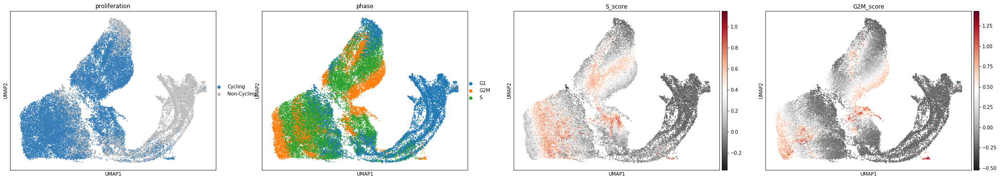

In [378]:
sc.pl.umap(adata_hvg,color=['proliferation','phase','S_score','G2M_score'],cmap='RdGy_r')

# Epithelial populations - Figure 2

## Cell numbers of Ngn3+ cells - Figure 2B

In [914]:
x=pd.crosstab(adata_all.obs['Ngn3+'],adata_all.obs['day'])

In [915]:
x

day,12.5,13.5,14.5,15.5
Ngn3+,,,,
False,9835,3526,6492,9238
True,955,1516,3141,1648


In [907]:
x.loc['Positive']

day
12.5     920
13.5    1354
14.5    1898
15.5     892
Name: Positive, dtype: int64

In [912]:
adata_hvg.obs['day'].value_counts()

15.5    10886
12.5    10790
14.5     9633
13.5     5042
Name: day, dtype: int64

## UMAP - Figure 2C,F

In [ ]:
sc.set_figure_params(vector_friendly=True,color_map='RdGy_r',dpi_save=300,transparent=True)
sc.pl.umap(adata_hvg,color='day',title='',save='_fig5_days.pdf',size=1)

saving figure to file ./figures/umap_fig2c.pdf


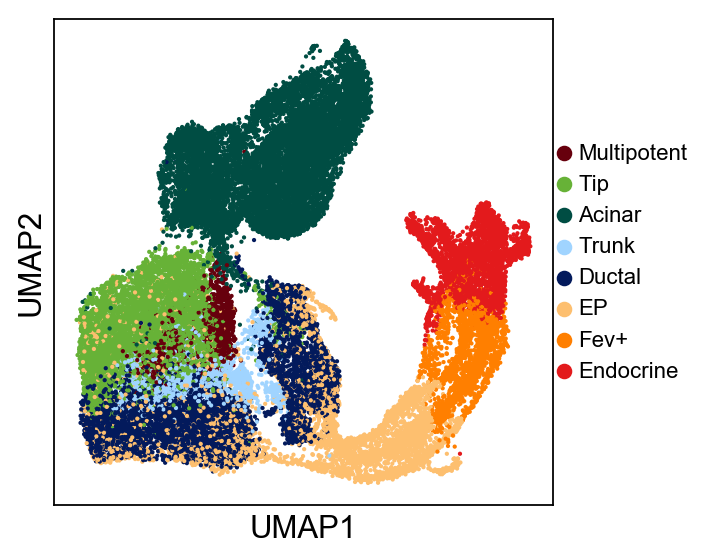

saving figure to file ./figures/umap_fig2c_Multipotent.pdf


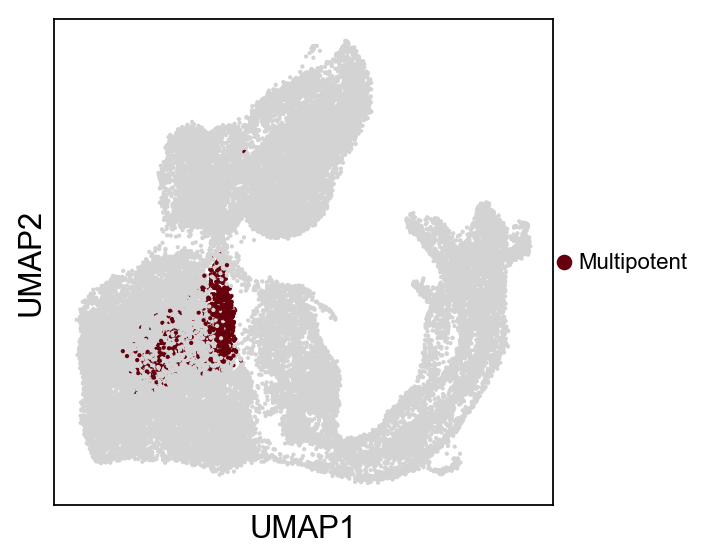

saving figure to file ./figures/umap_fig2c_Tip.pdf


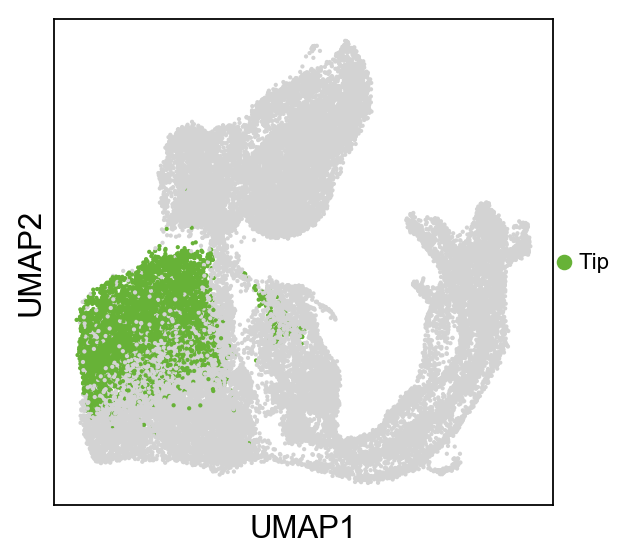

saving figure to file ./figures/umap_fig2c_Acinar.pdf


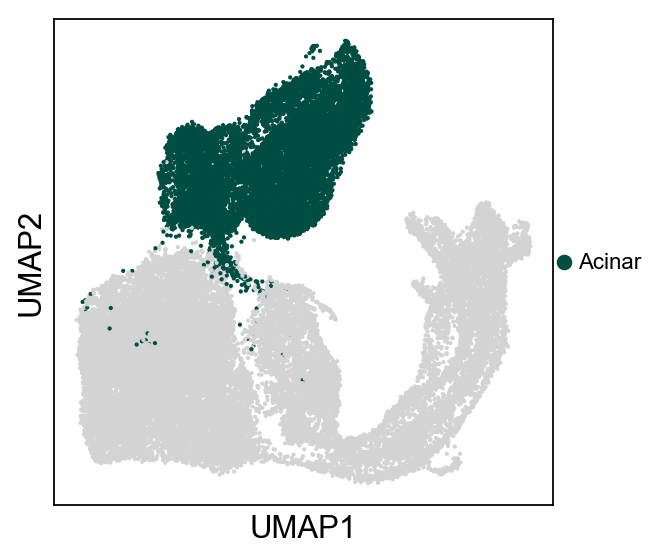

saving figure to file ./figures/umap_fig2c_Trunk.pdf


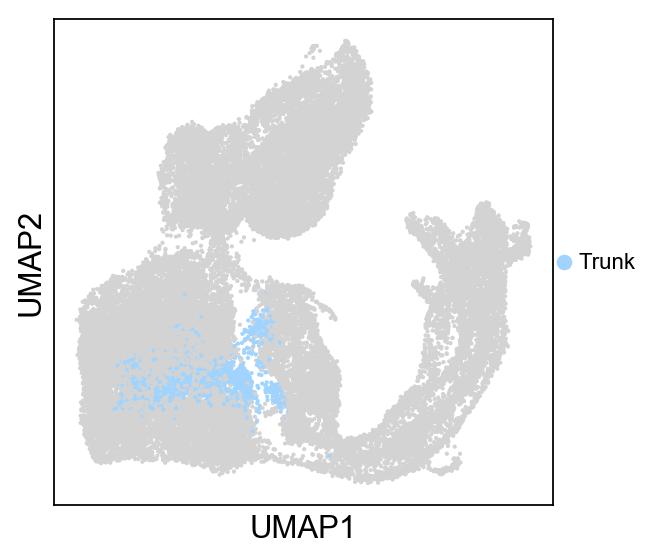

saving figure to file ./figures/umap_fig2c_Ductal.pdf


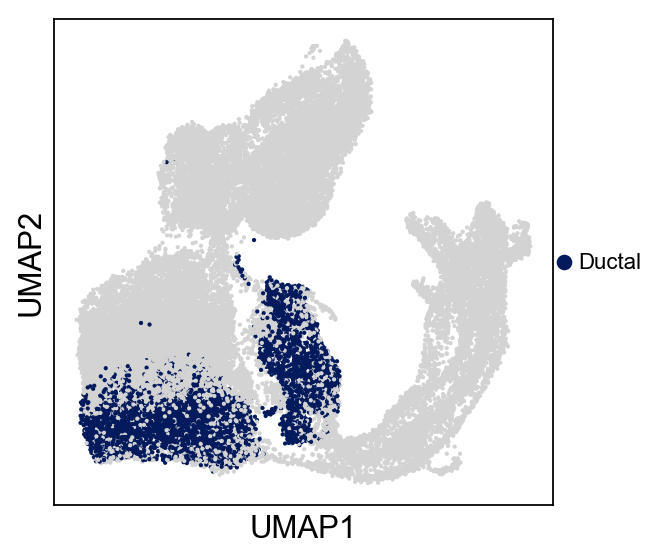

saving figure to file ./figures/umap_fig2c_EP.pdf


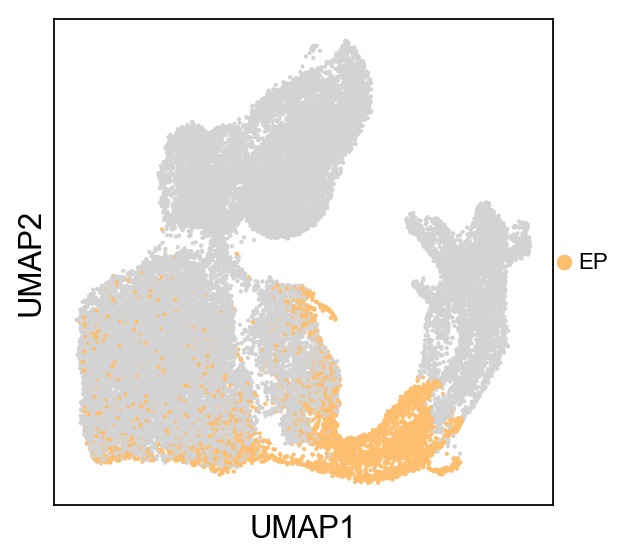

saving figure to file ./figures/umap_fig2c_Fev+.pdf


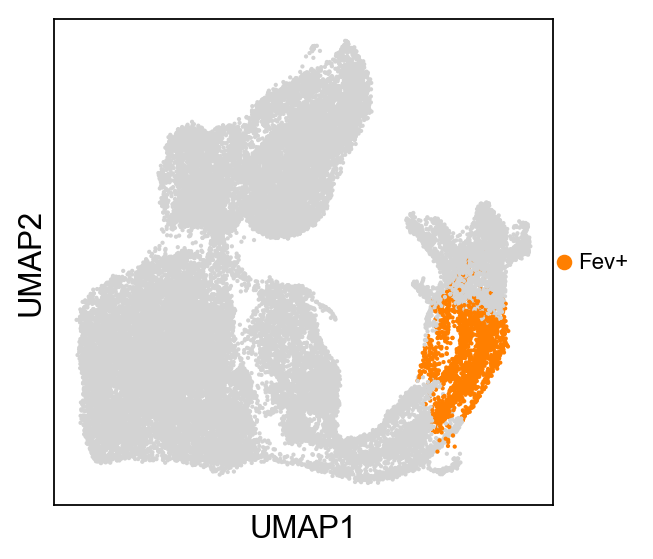

saving figure to file ./figures/umap_fig2c_Endocrine.pdf


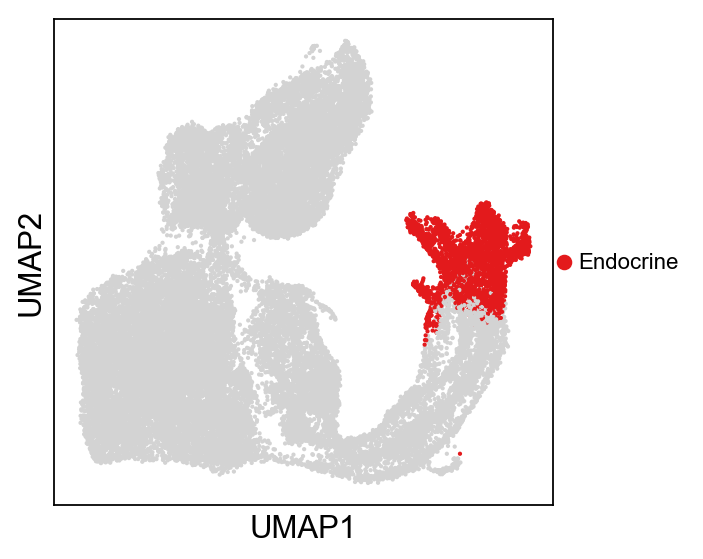

In [272]:
sc.set_figure_params(vector_friendly=True,color_map='RdGy_r',dpi_save=300,transparent=True)
sc.pl.umap(adata_hvg,color=['clusters_fig2_final'],legend_fontsize=10,save='_fig2c.pdf',title='')
for cat in adata_hvg.obs['clusters_fig2_final'].cat.categories:
    sc.pl.umap(adata_hvg,color=['clusters_fig2_final'],groups=[cat],legend_fontsize=10,save='_fig2c_'+cat+'.pdf',title='')

## marker gene identification - Table S1

In [4]:
sc.tl.rank_genes_groups(adata_all, groupby='clusters_fig2_final', n_genes=200)

ranking genes
    finished (0:00:58.69) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


In [7]:
writer = pd.ExcelWriter('./Table_1.xlsx', engine='xlsxwriter')
for i in adata_hvg.obs['clusters_fig2_final'].cat.categories:
    names = adata_all.uns['rank_genes_groups']['names'][i]
    scores = adata_all.uns['rank_genes_groups']['scores'][i]
    lfc = adata_all.uns['rank_genes_groups']['logfoldchanges'][i]
    p = adata_all.uns['rank_genes_groups']['pvals'][i]
    p_adj = adata_all.uns['rank_genes_groups']['pvals_adj'][i]
    pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj}).to_excel(writer,sheet_name=i)
writer.save()

## dotplot - Figure 2E

saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/dotplot_fig1.pdf


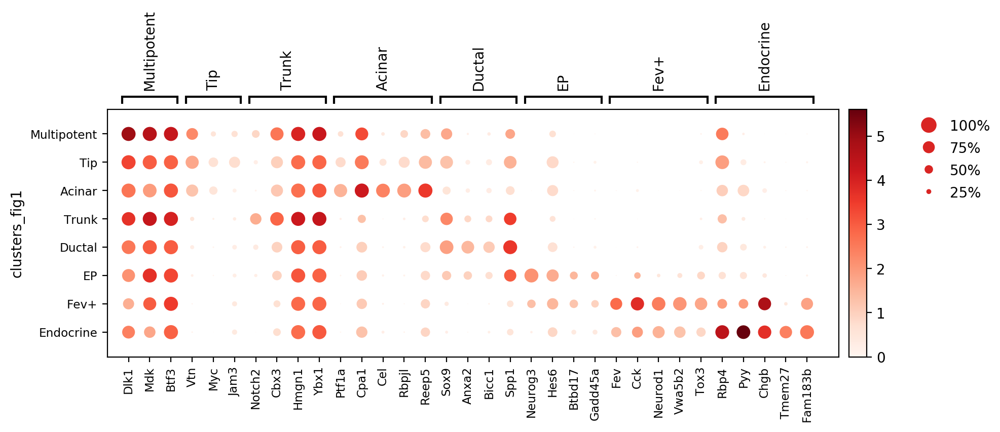

GridSpec(2, 4, height_ratios=[0.5, 10], width_ratios=[16.5, 0.4, 0.7, 0.5])

In [890]:
genelist = ['Dlk1','Mdk','Btf3',
            'Vtn','Myc','Jam3',
            'Notch2','Cbx3','Hmgn1','Ybx1',
            'Ptf1a','Cpa1', 'Cel','Rbpjl','Reep5',
            'Sox9','Anxa2','Bicc1','Spp1',
            'Neurog3', 'Hes6','Btbd17', 'Gadd45a',
            'Fev', 'Cck', 'Neurod1','Vwa5b2','Tox3',
            'Rbp4','Pyy', 'Chgb','Tmem27','Fam183b']
clusters = adata_all.obs['clusters_fig2_final'].cat.categories
labels=['Multipotent', 'Tip', 'Trunk','Acinar', 'Ductal', 'EP',
       'Fev+', 'Endocrine']
positions=[(0, 2), (3, 5), (6, 9), (10, 14), (15, 18), (19, 22), (23, 27), (28, 32)]
sc.pl.dotplot(adata_all, genelist, groupby='clusters_fig2_final',
              var_group_positions=positions, 
              var_group_labels=labels, var_group_rotation=90,save='_fig1.pdf')

# Lineage segregation of epithelial cells - Figure 3

## UMAP - Figure 3A,B

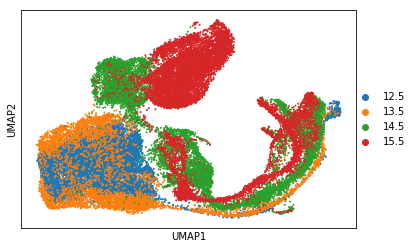

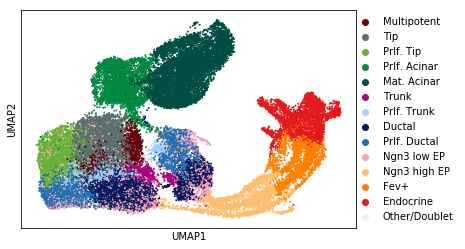

In [64]:
sc.pl.umap(adata_hvg,color=['day'],legend_fontsize=10,title='')
sc.pl.umap(adata_hvg,color=['clusters_fig3_final'],legend_fontsize=10,title='')

## Cell cycle score - Figure S2A

calculate cell cycle score using the list from Tirosh et al., 2016 (see also scanpy tutorial)

In [376]:
cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes_10X.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_all.var_names]

sc.tl.score_genes_cell_cycle(adata_all, s_genes=s_genes, g2m_genes=g2m_genes)


calculating cell cycle phase
computing score 'S_score'
    finished (0:00:18.46) --> added
    'S_score', score of gene set (adata.obs)
computing score 'G2M_score'
    finished (0:00:11.92) --> added
    'G2M_score', score of gene set (adata.obs)
-->     'phase', cell cycle phase (adata.obs)


In [ ]:
adata_hvg.obs['phase'] = pd.Categorical(adata_all.obs['phase'])
ref_cluster = pd.Categorical(adata_hvg.obs['phase'],categories=['S','G2M','G1','Cycling','Non-Cycling'])
x = adata_hvg.obs['phase'] =='S'
ref_cluster[x] = 'Cycling'
x = adata_hvg.obs['phase'] =='G2M'
ref_cluster[x]='Cycling'
x = adata_hvg.obs['phase'] =='G1'
ref_cluster[x]='Non-Cycling'
adata_hvg.obs['proliferation'] = ref_cluster
adata_hvg.obs['proliferation'].cat.remove_unused_categories(inplace=True)

In [377]:
adata_hvg.obs['S_score']=adata_all.obs['S_score']
adata_hvg.obs['G2M_score']=adata_all.obs['G2M_score']
adata_hvg.uns['proliferation_colors']=['#377eb8','#bdbdbd']


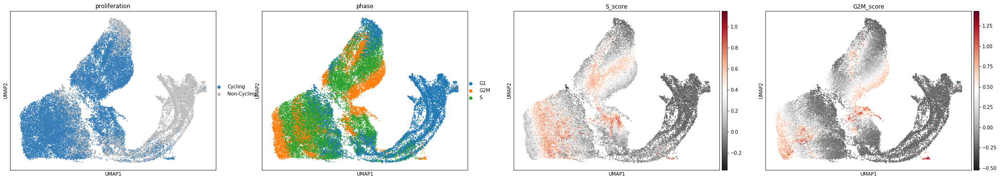

In [378]:
sc.pl.umap(adata_hvg,color=['proliferation','phase','S_score','G2M_score'],cmap='RdGy_r')

## Composition - Figure 3C

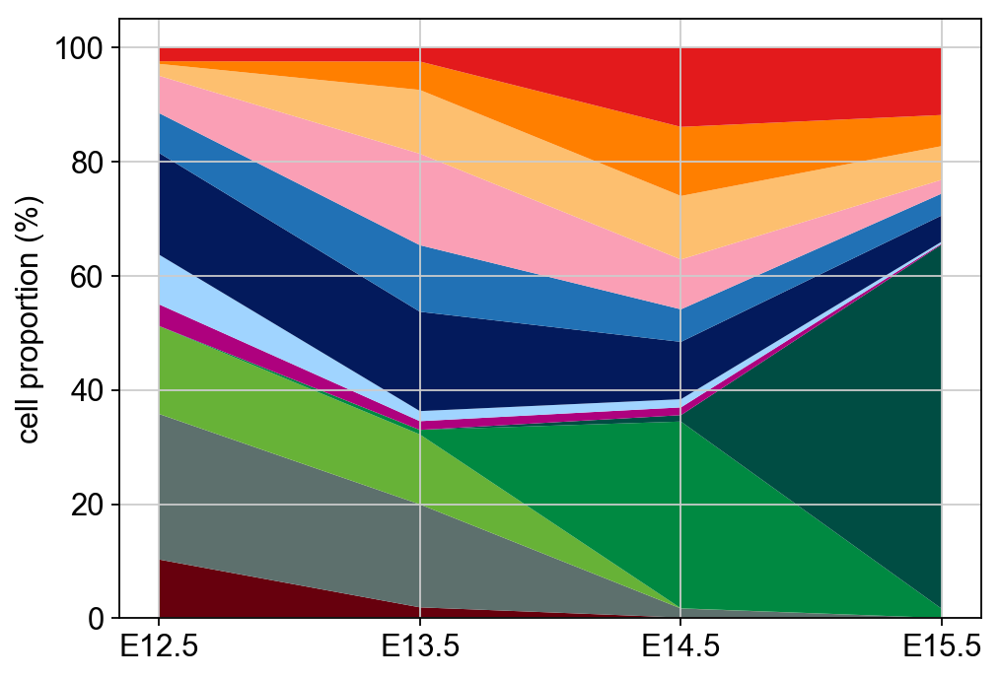

In [275]:
group='clusters_fig3_final'  #### the annotation of the different clusters/groups (on x axis)
cols=adata_hvg.uns['clusters_fig3_final_colors']
groups_to_show=adata_hvg.obs[group].cat.categories  ### adata.obs[group].cat.categories if all groups
hue_group='day'  #### the annotation to sort by within the groups

df=pd.crosstab(columns=adata_hvg.obs[group],index=adata_hvg.obs[hue_group],normalize='index')
df=df.unstack().reset_index()
df=pd.DataFrame(df.values,columns=[group,hue_group,'values'])

rcParams['figure.figsize'] = (7,5)

x=range(1,5)
mpc=df['values'][0:4].values*100
tip=df['values'][4:8].values*100
tip_pr=df['values'][8:12].values*100
ac_pr=df['values'][12:16].values*100
ac_mat=df['values'][16:20].values*100
trunk=df['values'][20:24].values*100
trunk_pr=df['values'][24:28].values*100
duct_pr=df['values'][28:32].values*100
duct=df['values'][32:36].values*100
ep_early=df['values'][36:40].values*100
ep=df['values'][40:44].values*100
pre_endo=df['values'][44:48].values*100
endo=df['values'][48:52].values*100

y=[list(mpc), list(tip),list(tip_pr), list(ac_pr), list(ac_mat),list(trunk),
   list(trunk_pr),list(duct_pr),list(duct),list(ep_early),list(ep),list(pre_endo),list(endo)]#,list(una)


ax=pl.subplot()
pl.stackplot(x,y, labels=['Multipotent', 'Tip', 'Prlf. Tip', 'Prlf. Acinar', 'Mat. Acinar',
       'Trunk', 'Prlf. Trunk', 'Ductal', 'Prlf. Ductal', 'early EP', 'EP',
       'Fev+', 'Endocrine'],#
             colors=cols)#
pl.xticks([1,2,3,4])
ax.set_xticklabels(['E12.5','E13.5','E14.5','E15.5'],fontdict={'fontsize':'14'})
pl.ylabel('cell proportion (%)')
pl.savefig('./epithelial_clusters_area_plot.pdf',dpi=300,format='pdf')
pl.show()
pl.rcParams.update(pl.rcParamsDefault)

## Ngn3 low cell's origin - Figure 3D

In [7]:
x=pd.crosstab(adata_hvg.obs['clusters_fig3_final_noep'],adata_hvg.obs['clusters_fig3_final'])
df=pd.DataFrame(x['Ngn3 low EP'])
df=df.reset_index()

In [27]:
df.values

array([['Multipotent', 19],
       ['Tip', 178],
       ['Prlf. Tip', 137],
       ['Prlf. Acinar', 0],
       ['Mat. Acinar', 0],
       ['Trunk', 94],
       ['Prlf. Trunk', 49],
       ['Ductal', 1487],
       ['Prlf. Ductal', 652],
       ['Ngn3 high EP', 0],
       ['Fev+', 0],
       ['Endocrine', 0]], dtype=object)

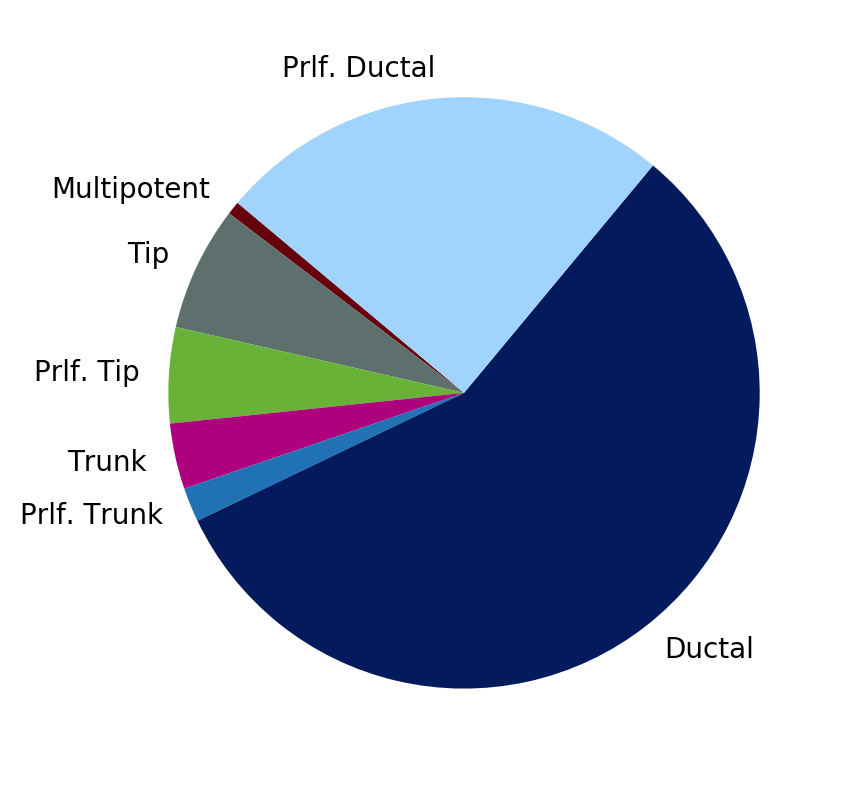

In [276]:
cols=['#67000D','#5D706D','#67B237','#ae017e','#2171b5','#031A5C','#A0D4FF']

sizes=np.array([19,178,137,94,49,1487,652])

pl.pie(sizes,startangle=140,colors=cols,labels=names)
pl.savefig('./piechart_Ngn3.pdf',dpi=300,format='pdf')
pl.show()

We also check the fration of Ngn3 low EPs in each epithelial population (not shown in the manuscript). Less than 5% of the cells in the MPC and tip clusters are Ngn3 low EPs indicating that they only contribute a minor fraction to the endocrine progenitor pool.

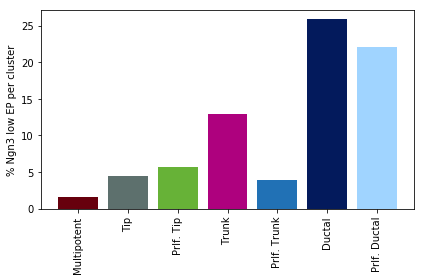

In [90]:
df_ep=pd.DataFrame(df.values)
df_ep=df_ep.set_index(0)
df_all=pd.DataFrame(adata_hvg.obs['clusters_fig3_final_noep'].value_counts())

df_all=df_all.loc[['Multipotent', 'Tip', 'Prlf. Tip',
       'Trunk', 'Prlf. Trunk', 'Ductal', 'Prlf. Ductal']]
df_ep=df_ep.loc[['Multipotent', 'Tip', 'Prlf. Tip',
       'Trunk', 'Prlf. Trunk', 'Ductal', 'Prlf. Ductal']]

data=df_ep/df_all.values*100

data=data.reset_index()
data.columns=['a','Ngn3 low EP/cluster (%)']

cols=['#67000D','#5D706D','#67B237','#ae017e','#2171b5','#031A5C','#A0D4FF']

ax=pl.subplot()
pl.bar(x=data['a'],height=data['Ngn3 low EP/cluster (%)'],color=cols)
pl.xlabel("")
pl.ylabel('% Ngn3 low EP per cluster')
pl.xticks(rotation=90)
pl.tight_layout()
pl.savefig('./EP_per_clusters_revision.pdf',dpi=300,format='pdf')
pl.show()

## PAGA - Figure 3F

running partition-based graph abstraction (PAGA)
    finished (0:00:01.78) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])
saving figure to file ./figures/paga_new.pdf


/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


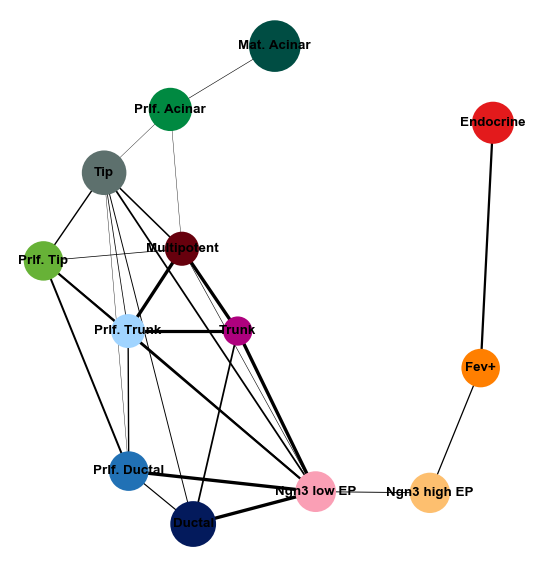

In [274]:
sc.tl.paga(adata_hvg,groups='clusters_fig3_final')
adata_hvg.obs['clusters_fig3_final'].cat.categories
pos=np.array([[-3.276080093 , -1.2],#mpc
       [-5.1822512769, 0],#tip
       [-6.6674343885, -1.39223995  ],#prlf tip
       [-3.5600819481,  1],#prlf acinar
       [-1,  2],#mat acinar
       [-1.9095328425, -2.5],#trunk
       [-4.5944196209, -2.5],#prlf trunk
       [-3, -5.5473209737],#duct
       [-4.5787940696, -4.7118794041],#prlf.duct
       [0, -5.0359884718],#early ep
       [ 2.7994142546, -5.0550800284],#ep
       [4.0438095194, -3.0846208514],#pre-endo
       [4.3462040595,  0.7894487691]])#,#endo
       #[ 1.6606745977,  -2.0063632865]])#unassigned
sc.pl.paga(adata_hvg,edge_width_scale=0.2,threshold=0.11,pos=pos,fontsize=6,node_size_scale=2,frameon=False,
           save=True)

## Diffusion map for revision

The diffusion map shows similar connections and lineage segregations as indicated by UMAP embedding and supported by PAGA.

In [48]:
sc.tl.diffmap(adata_hvg)

computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.         0.99941725 0.99709696 0.9950811  0.98973083 0.98772925
     0.9865506  0.98420715 0.9821114  0.97714746 0.97659093 0.9753537
     0.9738527  0.9721897  0.97165215]
    finished (0:00:02.90) --> added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns)


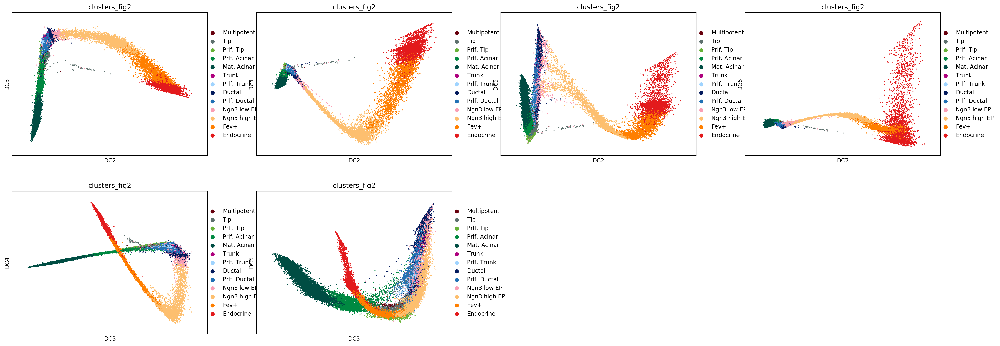

In [51]:
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=300,transparent=True)
pl.rcParams.update(pl.rcParamsDefault)
sc.pl.diffmap(adata_hvg,color=['clusters_fig3_final'],components=['1,2','1,4','1,5','2,3','2,4'])

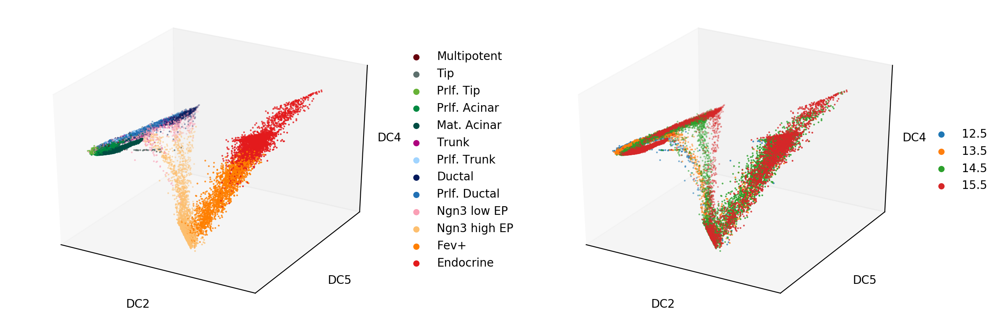

In [62]:
sc.pl.diffmap(adata_hvg,color=['clusters_fig3_final','day'],components=['1,4,3'],projection='3d',wspace=0.2,size=1,title='')

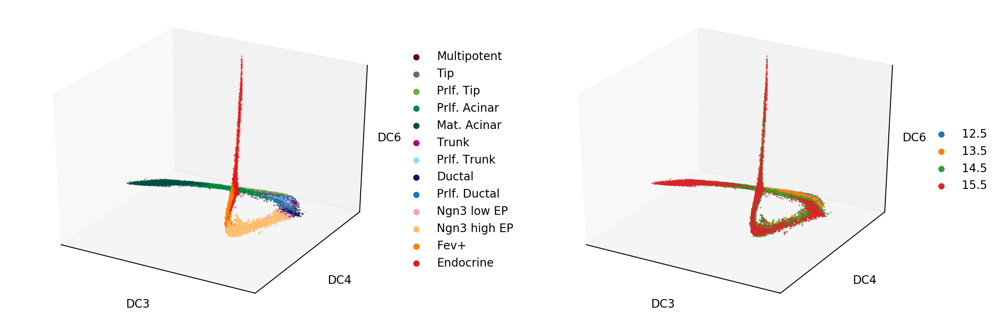

In [60]:
sc.pl.diffmap(adata_hvg,color=['clusters_fig3_final','day'],components=['2,3,5'],projection='3d',wspace=0.2,size=1,title='')


# Characterization of endocrine progenitors-precursors - Figure 4

In [277]:
adata_hvg.uns['clusters_fig4_final_colors']=['#390032','#fa9fb5', '#fdbf6f', '#ff7f00','#d9d9d9']

saving figure to file ./figures/umap_fig5_groups.pdf


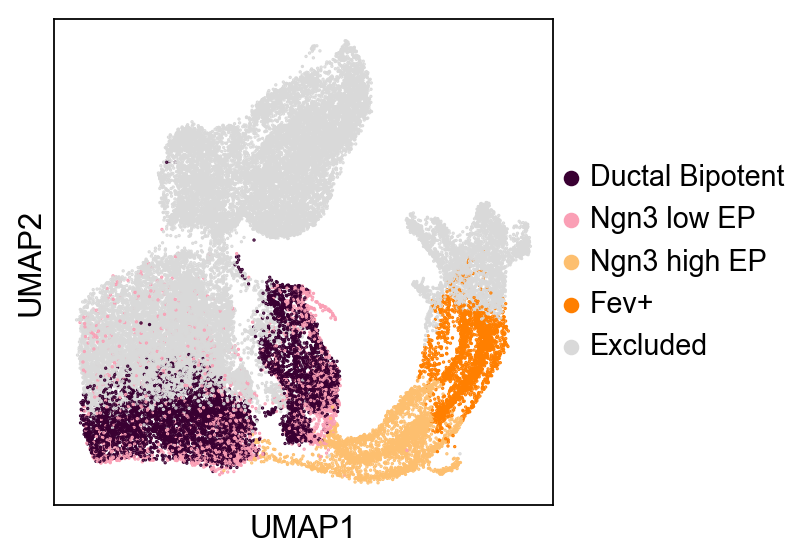

In [278]:
sc.set_figure_params(vector_friendly=True,color_map='RdGy_r',dpi_save=300,transparent=True)
sc.pl.umap(adata_hvg,color='clusters_fig4_final',title='',save='_fig5_groups.pdf',size=1)

## Genes enriched in Ngn3+ cells - Table S2

In [1160]:
adata_all.obs['Ngn3+'] = pd.Categorical(list(map(str,list(adata_all[:,'Neurog3'].X > 0))))
ref_cluster=pd.Categorical(adata_all.obs['clusters_fig2_final'],
                           categories=['Multipotent', 'Tip', 'Acinar', 'Trunk', 'Ductal', 'EP', 'Fev+',
       'Endocrine','Negative', 'Positive','Excluded'])

ix=np.isin(ref_cluster,['Fev+', 'Endocrine','Multipotent', 'Tip','Trunk', 'Ductal']) | ((adata_all.obs['Ngn3+'] == 'False') & ~np.isin(ref_cluster,['Acinar']))
ref_cluster[ix]='Negative'
ix=np.isin(ref_cluster,['Acinar'])
ref_cluster[ix]='Excluded'
ref_cluster2=adata_hvg.obs['clusters_fig3_final']
ix=(np.isin(ref_cluster2,['Ngn3 low EP','Ngn3 high EP'])) & (adata_all.obs['Ngn3+'] == 'True')

ref_cluster[ix]='Positive'
adata_all.obs['Ngn3Class']=pd.Categorical(ref_cluster,categories=['Positive','Negative','Excluded'])

In [1161]:
adata_all.uns['Ngn3Class_colors']=['#fc8d62','#8da0cb','#f0f0f0']
adata_all.uns['Ngn3Class_colors']=['#b2df8a','#1f78b4','#f0f0f0']

saving figure to file ./figures/umap_fig4_ngn3_classes.pdf


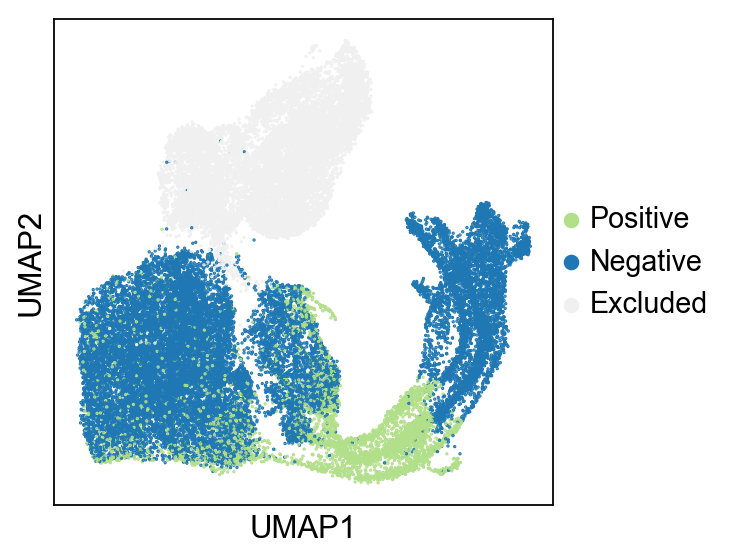

In [509]:
sc.set_figure_params(vector_friendly=True,color_map='RdGy_r',dpi_save=300,transparent=True)
sc.pl.umap(adata_all,color='Ngn3Class',title='',save='_ngn3_classes.pdf',size=1)

ranking genes
    finished (0:00:10.12) --> added to `.uns['rank_genes_Ngn3+']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids
ranking genes
    finished (0:00:04.64) --> added to `.uns['rank_genes_Ngn3-']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


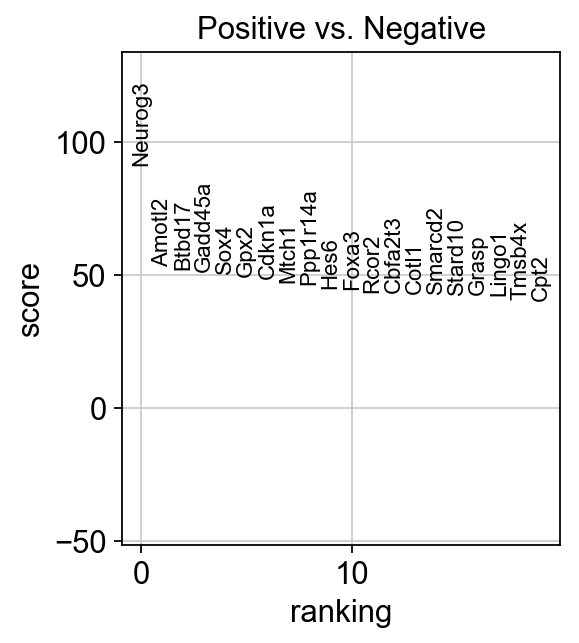

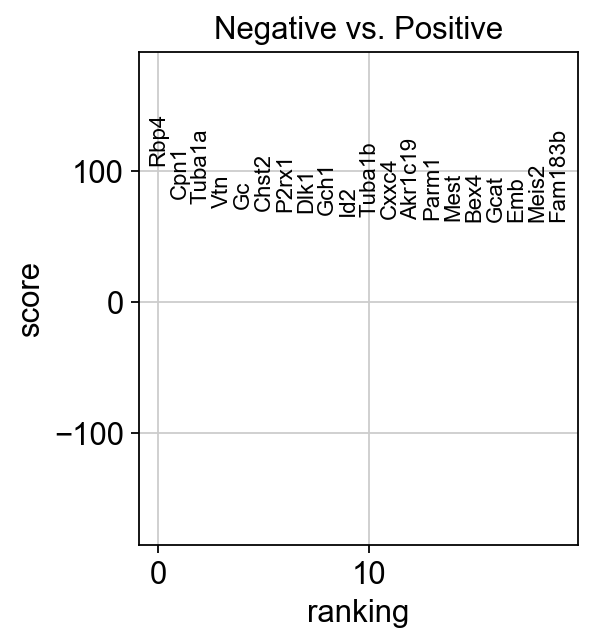

In [510]:
sc.tl.rank_genes_groups(adata_all, groupby='Ngn3Class', key_added='rank_genes_Ngn3+', groups=['Positive'], reference='Negative', n_genes=17327)
sc.tl.rank_genes_groups(adata_all, groupby='Ngn3Class', key_added='rank_genes_Ngn3-', groups=['Negative'], reference='Positive', n_genes=17327)
sc.pl.rank_genes_groups(adata_all, key='rank_genes_Ngn3+', fontsize=10)
sc.pl.rank_genes_groups(adata_all, key='rank_genes_Ngn3-', fontsize=10)

In [515]:
names = adata_all.uns['rank_genes_Ngn3+']['names']['Positive']
scores = adata_all.uns['rank_genes_Ngn3+']['scores']['Positive']
lfc = adata_all.uns['rank_genes_Ngn3+']['logfoldchanges']['Positive']
p = adata_all.uns['rank_genes_Ngn3+']['pvals']['Positive']
p_adj = adata_all.uns['rank_genes_Ngn3+']['pvals_adj']['Positive']
df=pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj})[0:250]
df.to_csv('./ngn3_up.csv')

In [518]:
names = adata_all.uns['rank_genes_Ngn3-']['names']['Negative']
scores = adata_all.uns['rank_genes_Ngn3-']['scores']['Negative']
lfc = adata_all.uns['rank_genes_Ngn3-']['logfoldchanges']['Negative']
p = adata_all.uns['rank_genes_Ngn3-']['pvals']['Negative']
p_adj = adata_all.uns['rank_genes_Ngn3-']['pvals_adj']['Negative']
df=pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj})[0:250]
df.to_csv('./ngn3_down.csv')

### gene set enrichment

we use enrichR (http://amp.pharm.mssm.edu/Enrichr/) using the gseapy package for gene set enrichment

In [ ]:
data = pd.DataFrame({'name':adata_all.uns['rank_genes_Ngn3+']['names']['Positive'],
             'log2FC':adata_all.uns['rank_genes_Ngn3+']['logfoldchanges']['Positive'],
             '-log10PV':np.log10(adata_all.uns['rank_genes_Ngn3+']['pvals_adj']['Positive'])*-1})

data.replace(np.inf,350,inplace=True)

ix_p=data['-log10PV'] > 2
ix_fc=data['log2FC'] > 1
ix_up=[a and b for a, b in zip(ix_fc,ix_p)]
print('Upregulated Genes:',sum(ix_up))
ix_fc=data['log2FC'] < -1
ix_down=[a and b for a, b in zip(ix_fc,ix_p)]
print('Downregulated Genes:',sum(ix_down))
del ix_fc
del ix_p

In [ ]:
writer = pd.ExcelWriter('./ngn3pos_enrichr.xlsx', engine='xlsxwriter')

gp.enrichr(gene_list=list(data[ix_up]['name']),
           description='',
           gene_sets='GO_Biological_Process_2018',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Upreg. GO')

gp.enrichr(gene_list=list(data[ix_up]['name']),
           description='',
           gene_sets='KEGG_2016',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Upreg. KEGG')

gp.enrichr(gene_list=list(data[ix_down]['name']),
           description='',
           gene_sets='GO_Biological_Process_2018',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Downreg. GO')

gp.enrichr(gene_list=list(data[ix_down]['name']),
           description='',
           gene_sets='KEGG_2016',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Downreg. KEGG')

writer.save()

## Volcano Plot - Figure 3B

In [674]:
def plot_volcano_top10(data,x, y,lfcthr,pthr,genes_annot_up,genes_annot_down, xax=None, yax=None,
                     data_point_size=50):
       
    ###
    fig, ax = pl.subplots()
    if xax is not None:
        ax.set_xlim(xax)
    if yax is not None:
        ax.set_ylim(yax)

    ### upregulated genes
    ix_up=data[x]>0
    data_up=data[ix_up]
    
    ix_fc=data_up[x]>lfcthr
    ix_p=data_up[y]>pthr
    ix_genes=[a and b for a, b in zip(ix_fc,ix_p)] 
    print(sum(ix_genes))
    col1=np.array(['black' if value else 'grey' for value in ix_genes])
        
    
    ax.scatter(data=data_up,x=x, y=y,  s=data_point_size,c=col1,rasterized=True) #scatter_kws={'c':DF_0['color']}
    
    ix_sig=np.isin(data_up['name'],genes_annot_up)

    data_up=data_up[ix_sig]
    for label, xa, ya in zip(data_up['name'],data_up[x],data_up[y]):
        if label == 'Amotl2':
            ax.annotate(label,xy=(xa, ya), xytext=(65, -25),textcoords='offset points', ha='right', va='bottom',fontsize=10,arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0') )#,bbox=dict(boxstyle='round,pad=0.2', fc='gray', alpha=0.1))

        else:    
            ax.annotate(label,xy=(xa, ya), xytext=(65, -35),textcoords='offset points', ha='right', va='bottom',fontsize=10,arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0') )#,bbox=dict(boxstyle='round,pad=0.2', fc='gray', alpha=0.1))
            # additional annotation styles
                #arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
                #bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),

    del data_up

    
    ### down regulated genes
    ix_down=data[x]<0
    data_down=data[ix_down]
    ix_fc=data_down[x]< -lfcthr
    ix_p=data_down[y]>pthr
    ix_genes=[a and b for a, b in zip(ix_fc,ix_p)] 
    col2=np.array(['black' if value else 'grey' for value in ix_genes])
   
    
    print(sum(ix_genes))
    
    ax.scatter(data=data_down,x=x, y=y,  s=data_point_size,c=col2,rasterized=True) #scatter_kws={'c':DF_0['color']}


    ix_sig=np.isin(data_down['name'],genes_annot_down)
    data_down=data_down[ix_sig]
    
    for label, xa, ya in zip(data_down['name'],data_down[x],data_down[y]):

        ax.annotate(label,xy=(xa, ya), xytext=(-15, 5),textcoords='offset points', ha='right', va='bottom',fontsize=10,arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'),bbox=dict(boxstyle='round,pad=0.2', fc='gray', alpha=0.1))

    del data_down


    ax.axhline(pthr,c='red',linestyle=':',linewidth=0.5)
    yax=ax.get_ylim()
    ax.axvline(lfcthr,c='red',linestyle=':',linewidth=0.5,ymin=(0-yax[0])/(yax[1]-yax[0]))  ### set start to 0
    ax.axvline(-lfcthr,c='red',linestyle=':',linewidth=0.5,ymin=(0-yax[0])/(yax[1]-yax[0]))  ### set start to 0
    
                
    ax.set_xlabel('log2(FC)')
    ax.set_ylabel('-log10(p-value)')
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(16)

    return(ax)

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


522
595


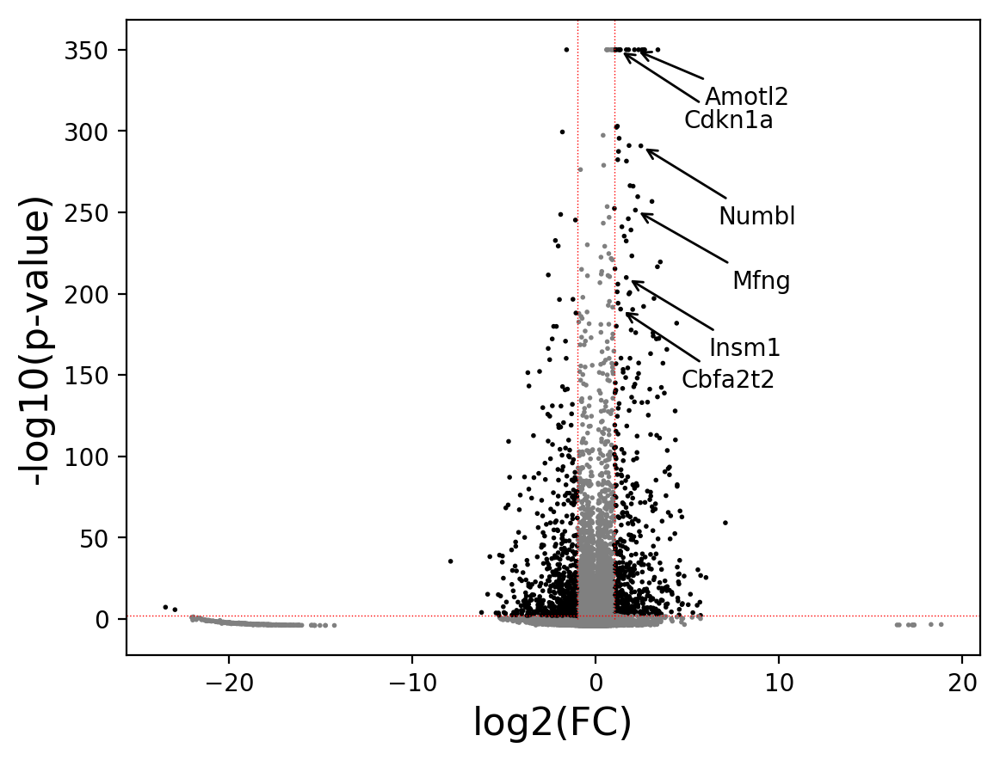

In [676]:
volcanodata = pd.DataFrame({'name':adata_all.uns['rank_genes_Ngn3+']['names']['Positive'],
             'log2FC':adata_all.uns['rank_genes_Ngn3+']['logfoldchanges']['Positive'],
             'pvals':np.log10(adata_all.uns['rank_genes_Ngn3+']['pvals_adj']['Positive'])*-1})
volcanodata = volcanodata[volcanodata.name != 'Neurog3']

labellist = ['Amotl2', 'Cdkn1a','Mfng','Numbl','Insm1','Cbfa2t2']

plot_volcano_top10(volcanodata.replace(np.inf,350),'log2FC','pvals',1,2,genes_annot_up=labellist,genes_annot_down=[],data_point_size=1)
pl.savefig('./volcano.pdf',dpi=150)
del volcanodata
del labellist

## Heatmap of top Ngn3+ enriched genes - Figure 3C

In [677]:
ngn3_genes=pd.read_excel('./Table_S2.xlsx', sheet_name='Upregulated in Ngn3+')['Names'].tolist()

In [1162]:
adata_ngn3_class=adata_all[np.isin(adata_all.obs['Ngn3Class'],['Positive','Negative'])].copy()

In [683]:
adata_ngn3_class=adata_all[np.isin(adata_all.obs['Ngn3Class'],['Positive','Negative'])].copy()
adata_ngn3_class_scales=sc.pp.scale(adata_ngn3_class,copy=True,zero_center=False)

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/scanpy/preprocessing/simple.py:1145: RuntimeWarning: divide by zero encountered in true_divide
  sparsefuncs.inplace_column_scale(X, 1/scale)


saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/matrixplot_fig4_top30.pdf


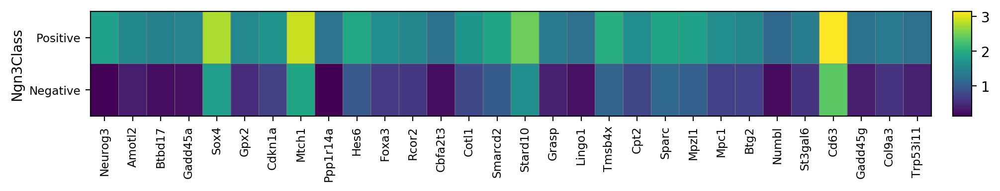

GridSpec(2, 2, height_ratios=[0, 10.5], width_ratios=[18.0, 0.4])

In [712]:
sc.pl.matrixplot(adata_ngn3_class_scales,groupby='Ngn3Class',var_names=ngn3_genes[0:30],save='_fig4_top30.pdf')

## Violin plot of top Ngn3+ enriched genes - Figure 3D

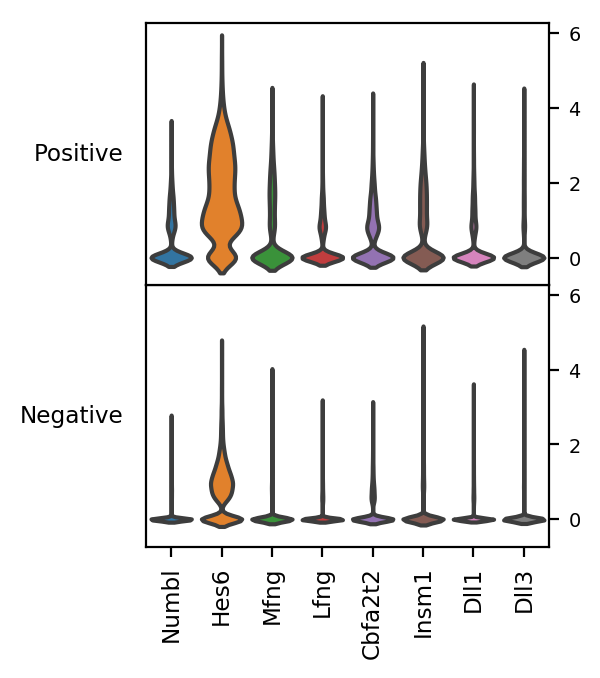

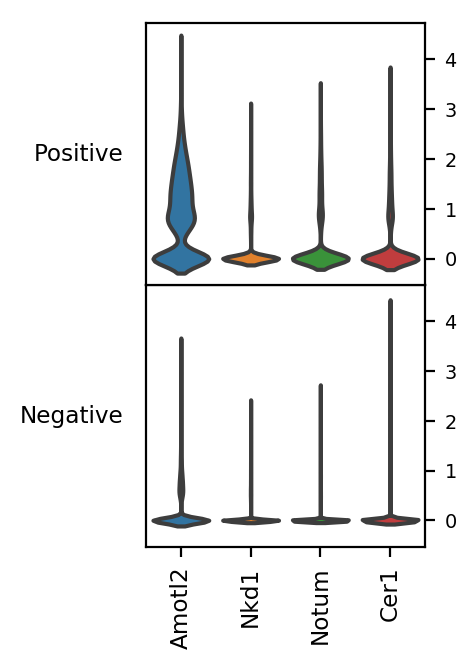

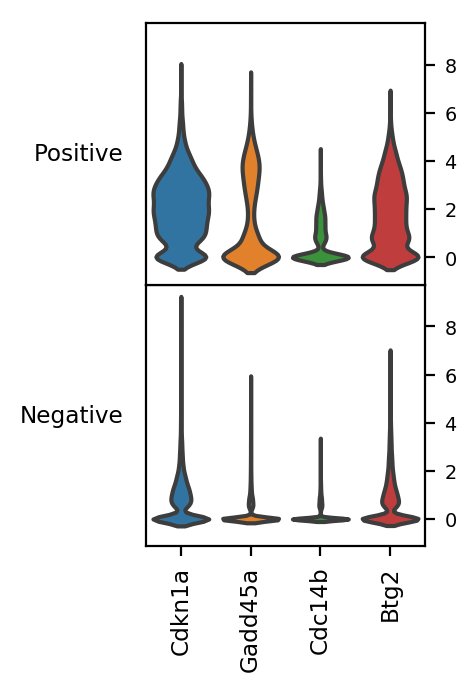

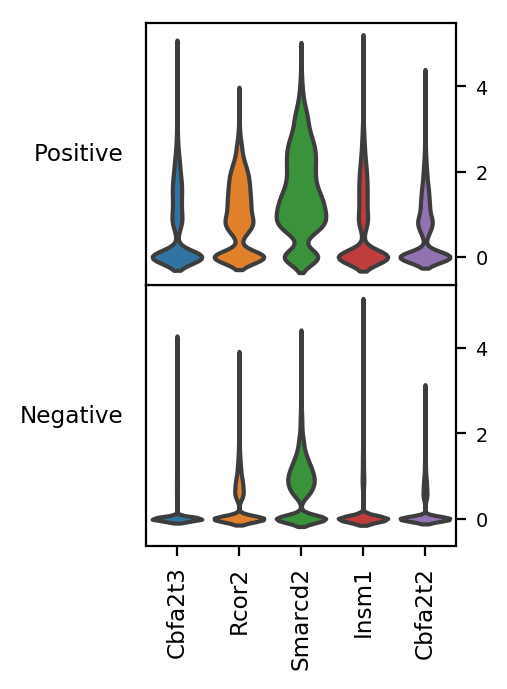

GridSpec(2, 1)

In [1167]:
sc.pl.stacked_violin(adata_ngn3_class,var_names=['Numbl','Hes6','Mfng','Lfng','Cbfa2t2','Insm1','Dll1','Dll3'],groupby='Ngn3Class')
sc.pl.stacked_violin(adata_ngn3_class,var_names=['Amotl2','Nkd1','Notum','Cer1'],groupby='Ngn3Class')
sc.pl.stacked_violin(adata_ngn3_class,var_names=['Cdkn1a','Gadd45a','Cdc14b','Btg2'],groupby='Ngn3Class')
sc.pl.stacked_violin(adata_ngn3_class,var_names=['Cbfa2t3','Rcor2','Smarcd2','Insm1','Cbfa2t2'],groupby='Ngn3Class')

## Cell numbers of Ngn3+ cells - Figure 2B

In [914]:
x=pd.crosstab(adata_all.obs['Ngn3+'],adata_all.obs['day'])

In [915]:
x

day,12.5,13.5,14.5,15.5
Ngn3+,,,,
False,9835,3526,6492,9238
True,955,1516,3141,1648


In [907]:
x.loc['Positive']

day
12.5     920
13.5    1354
14.5    1898
15.5     892
Name: Positive, dtype: int64

In [912]:
adata_hvg.obs['day'].value_counts()

15.5    10886
12.5    10790
14.5     9633
13.5     5042
Name: day, dtype: int64

# Gene expression during endocrinogenesis - Figure 5

## Upregulated genes along differentiation trajectory from ductal to endocrine - Figure S3A, Table S3


In [72]:
adata_sub=adata_all[np.invert(np.isin(adata_all.obs['clusters_fig4_final'],['Excluded']))].copy()

In [73]:
sc.tl.rank_genes_groups(adata_sub, groupby='clusters_fig4_final', 
                        key_added='rank_genes_stages_1vs2',groups=['Ductal Bipotent'], 
                        reference='Ngn3 low EP', n_genes=200)
sc.tl.rank_genes_groups(adata_sub, groupby='clusters_fig4_final', 
                        key_added='rank_genes_stages_2vs1', groups=['Ngn3 low EP'], 
                        reference='Ductal Bipotent', n_genes=200)
sc.tl.rank_genes_groups(adata_sub, groupby='clusters_fig4_final', 
                        key_added='rank_genes_stages_3vs2', groups=['Ngn3 high EP'], 
                        reference='Ngn3 low EP', n_genes=200)
sc.tl.rank_genes_groups(adata_sub, groupby='clusters_fig4_final', 
                        key_added='rank_genes_stages_4vs3', groups=['Fev+'], 
                        reference='Ngn3 high EP', n_genes=200)

ranking genes
    finished (0:00:02.71) --> added to `.uns['rank_genes_stages_1vs2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids
ranking genes
    finished (0:00:02.63) --> added to `.uns['rank_genes_stages_2vs1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids
ranking genes
    finished (0:00:01.24) --> added to `.uns['rank_genes_stages_3vs2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    '

In [74]:
genes_combined = list(adata_sub.uns['rank_genes_stages_1vs2']['names']['Ductal Bipotent'][0:20])
genes_combined += list(adata_sub.uns['rank_genes_stages_2vs1']['names']['Ngn3 low EP'][0:20])
genes_combined += list(adata_sub.uns['rank_genes_stages_3vs2']['names']['Ngn3 high EP'][0:20])
genes_combined += list(adata_sub.uns['rank_genes_stages_4vs3']['names']['Fev+'][0:20])

saving figure to file ./figures/heatmapfig4_heatmap.png


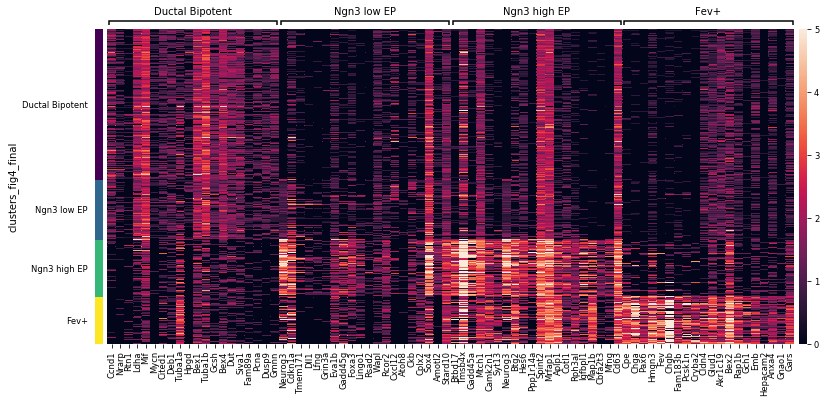

GridSpec(2, 3, height_ratios=[0.15, 6], width_ratios=[0.25, 23.0, 0.25])

In [80]:
sc.pl.heatmap(adata_sub,genes_combined, groupby='clusters_fig4_final', 
              var_group_positions=[(0, 19), (20, 39), (40, 59), (60, 79)], 
              var_group_labels=adata_sub.obs['clusters_fig4_final'].cat.categories,
              var_group_rotation=False,vmax=5,save='fig4_heatmap.png')

In [76]:
# Differential expression lists for clustering along developmental trajectory of cleaned data: ONE vs. ALL
writer = pd.ExcelWriter('./Table_S3_new.xlsx', engine='xlsxwriter')

names = adata_sub.uns['rank_genes_stages_1vs2']['names']['Ductal Bipotent']
scores = adata_sub.uns['rank_genes_stages_1vs2']['scores']['Ductal Bipotent']
lfc = adata_sub.uns['rank_genes_stages_1vs2']['logfoldchanges']['Ductal Bipotent']
p = adata_sub.uns['rank_genes_stages_1vs2']['pvals']['Ductal Bipotent']
p_adj = adata_sub.uns['rank_genes_stages_1vs2']['pvals_adj']['Ductal Bipotent']
pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj}).to_excel(writer,sheet_name='Ductal')

names = adata_sub.uns['rank_genes_stages_2vs1']['names']['Ngn3 low EP']
scores = adata_sub.uns['rank_genes_stages_2vs1']['scores']['Ngn3 low EP']
lfc = adata_sub.uns['rank_genes_stages_2vs1']['logfoldchanges']['Ngn3 low EP']
p = adata_sub.uns['rank_genes_stages_2vs1']['pvals']['Ngn3 low EP']
p_adj = adata_sub.uns['rank_genes_stages_2vs1']['pvals_adj']['Ngn3 low EP']
pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj}).to_excel(writer,sheet_name='Ngn3 low EP')

names = adata_sub.uns['rank_genes_stages_3vs2']['names']['Ngn3 high EP']
scores = adata_sub.uns['rank_genes_stages_3vs2']['scores']['Ngn3 high EP']
lfc = adata_sub.uns['rank_genes_stages_3vs2']['logfoldchanges']['Ngn3 high EP']
p = adata_sub.uns['rank_genes_stages_3vs2']['pvals']['Ngn3 high EP']
p_adj = adata_sub.uns['rank_genes_stages_3vs2']['pvals_adj']['Ngn3 high EP']
pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj}).to_excel(writer,sheet_name='Ngn3 high EP')

names = adata_sub.uns['rank_genes_stages_4vs3']['names']['Fev+']
scores = adata_sub.uns['rank_genes_stages_4vs3']['scores']['Fev+']
lfc = adata_sub.uns['rank_genes_stages_4vs3']['logfoldchanges']['Fev+']
p = adata_sub.uns['rank_genes_stages_4vs3']['pvals']['Fev+']
p_adj = adata_sub.uns['rank_genes_stages_4vs3']['pvals_adj']['Fev+']
pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj}).to_excel(writer,sheet_name='Fev+')

writer.save()

### gene set enrichment

In [ ]:
import gseapy as gp
writer = pd.ExcelWriter('./ngn_enrichr.xlsx', engine='xlsxwriter')

gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_1vs2']['names']['Ductal Bipotent']),
           description='',
           gene_sets='GO_Biological_Process_2018',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Ductal Bipotent GO')

gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_1vs2']['names']['Ductal Bipotent']),
           description='',
           gene_sets='KEGG_2016',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Ductal Bipotent KEGG')

gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_2vs1']['names']['Ngn3 low EP']),
           description='',
           gene_sets='GO_Biological_Process_2018',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Ngn3 low EP GO')

gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_2vs1']['names']['Ngn3 low EP']),
           description='',
           gene_sets='KEGG_2016',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Ngn3 low EP KEGG')
           
gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_3vs2']['names']['Ngn3 high EP']),
           description='',
           gene_sets='GO_Biological_Process_2018',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Ngn3 high EP GO')

gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_3vs2']['names']['Ngn3 high EP']),
           description='',
           gene_sets='KEGG_2016',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Ngn3 high EP KEGG')
           
gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_4vs3']['names']['Fev+']),
           description='',
           gene_sets='GO_Biological_Process_2018',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Fev+ GO')

gp.enrichr(gene_list=list(adata_sub.uns['rank_genes_stages_4vs3']['names']['Fev+']),
           description='',
           gene_sets='KEGG_2016',
           cutoff=0.05
          ).res2d.set_index('Term').to_excel(writer,sheet_name='Fev+ KEGG')

writer.save()

## EP signature along pseudotime

In [10]:
adata_sub=adata_all[np.isin(adata_all.obs['clusters_fig3_final'],['Ngn3 low EP',
       'Ngn3 high EP', 'Fev+', 'Endocrine'])].copy()

In [11]:
adata_sub_hvg=adata_hvg[np.isin(adata_all.obs['clusters_fig3_final'],['Ngn3 low EP',
       'Ngn3 high EP', 'Fev+', 'Endocrine'])].copy()

In [12]:
sc.pp.neighbors(adata_sub_hvg)
sc.tl.diffmap(adata_sub_hvg)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:11.57) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.         0.99881536 0.9943712  0.98775345 0.984965   0.9822295
     0.975433   0.97501916 0.97301376 0.97253567 0.96821237 0.9622817
     0.9614935  0.9599811  0.95630443]
    finished (0:00:00.45) --> added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns)


In [13]:
adata_sub_hvg.uns['iroot'] = np.flatnonzero(np.array([all(tup) for tup in zip(adata_sub.obs['clusters_fig3_final'] == 'Ngn3 low EP',(adata_sub[:,'Neurog3'].X>0))]))[5]
sc.tl.dpt(adata_sub_hvg,n_dcs=10,)


computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00.00) --> added
    'dpt_pseudotime', the pseudotime (adata.obs)


In [14]:
adata_sub.obs['dpt_pseudotime']=adata_sub_hvg.obs['dpt_pseudotime']

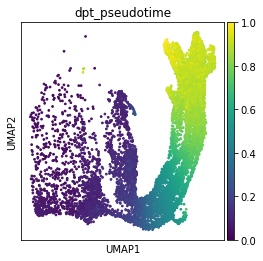

In [15]:
rcParams['figure.figsize'] = (4, 4)

sc.pl.umap(adata_sub_hvg,color='dpt_pseudotime')

In [924]:
genes=['Neurog3','Fev','Insm1']
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)

In [925]:
col_clust=['#fa9fb5', '#fdbf6f', '#ff7f00',
       '#e31a1c']

### Heatmap all EP enriched genes along pseudotime - Figure 5B

In [754]:
ngn3_genes=pd.read_excel('./Table_S2.xlsx', sheet_name='Upregulated in Ngn3+')['Names'].tolist()

create data frame and do polynominal regression fit

In [755]:
genes=ngn3_genes
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values
df=df.sort_values(by='pseudotime',ascending=True)

In [1162]:
df.shape


In [756]:
df_fit=df
for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    df_fit[gene]=f(df['pseudotime'])


In [529]:
df_fit.shape

(10176, 252)

sort fitted values by maximum expression in pseudotime

In [757]:
rowix=df_fit.drop(df_fit.columns[[250,251]], axis=1).T.idxmax(axis=1)
dpt=pd.DataFrame(df_fit['pseudotime'][rowix].values,index=df_fit.columns[0:df_fit.shape[1]-2])
dpt=dpt.sort_values(by=0,ascending=True)
df_fit_sort=df_fit[dpt.index]

plot clustermap

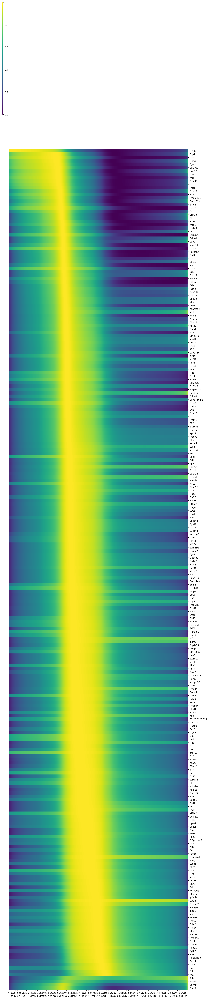

In [759]:
pl.rcParams.update(pl.rcParamsDefault)
sns.clustermap(df_fit_sort.T,col_cluster=False,row_cluster=False,cmap='viridis',standard_scale=0,figsize=(15,80))
pl.savefig('./ep_genes_dpt_full_new_250.png',dpi=150)
pl.show()

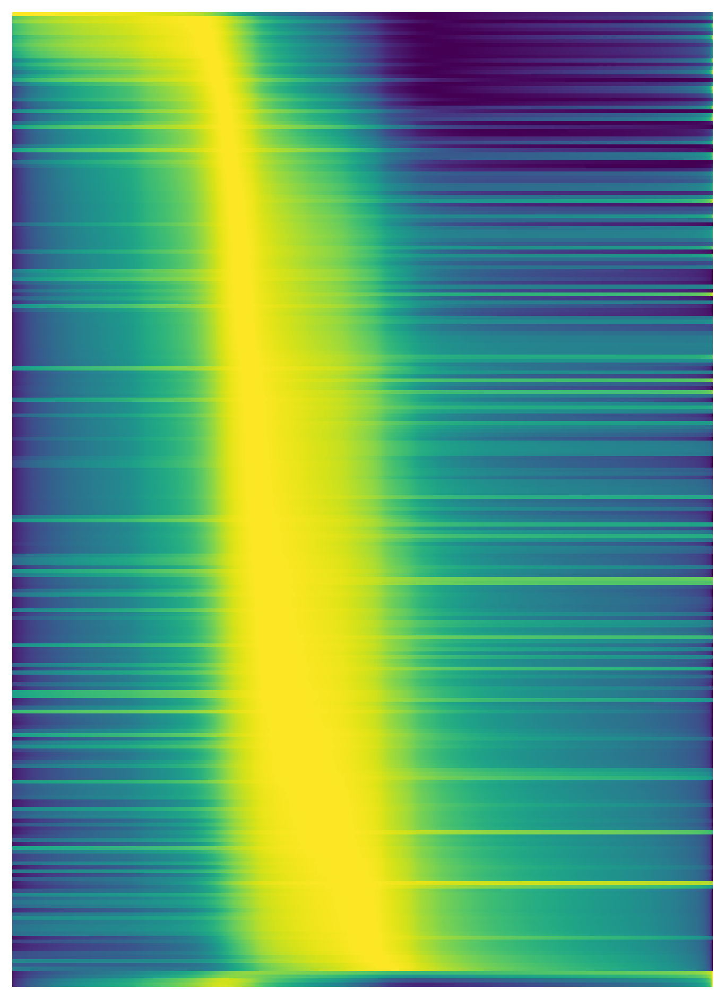

In [758]:
g=sns.clustermap(df_fit_sort.T,col_cluster=False,row_cluster=False,cmap='viridis',standard_scale=0,figsize=(10,15))
ax = g.ax_heatmap
g.cax.set_visible(False)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)

ax.set_xticks([])
ax.set_xticklabels([])
ax.set_yticks([])
ax.set_yticklabels([])
pl.title('')
pl.savefig('/Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/ep_genes_dpt_red_new_250.png')
pl.show()

### Heatmap all EP enriched genes along pseudotime - Figure S2D

In [1169]:
fev_genes=pd.read_excel('/Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Table_S1.xlsx', sheet_name='Fev+')['Names'].tolist()

In [1170]:
genes=fev_genes
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)

## we exclude one cell that has a pseudotime of 1 and seems to be far off
df=df.iloc[0:10150]
df_fit=df
for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    df_fit[gene]=f(df['pseudotime'])
rowix=df_fit.drop(df_fit.columns[[200,201]], axis=1).T.idxmax(axis=1)
dpt=pd.DataFrame(df_fit['pseudotime'][rowix].values,index=df_fit.columns[0:df_fit.shape[1]-2])
dpt=dpt.sort_values(by=0,ascending=True)
df_fit_sort_fev=df_fit[dpt.index]

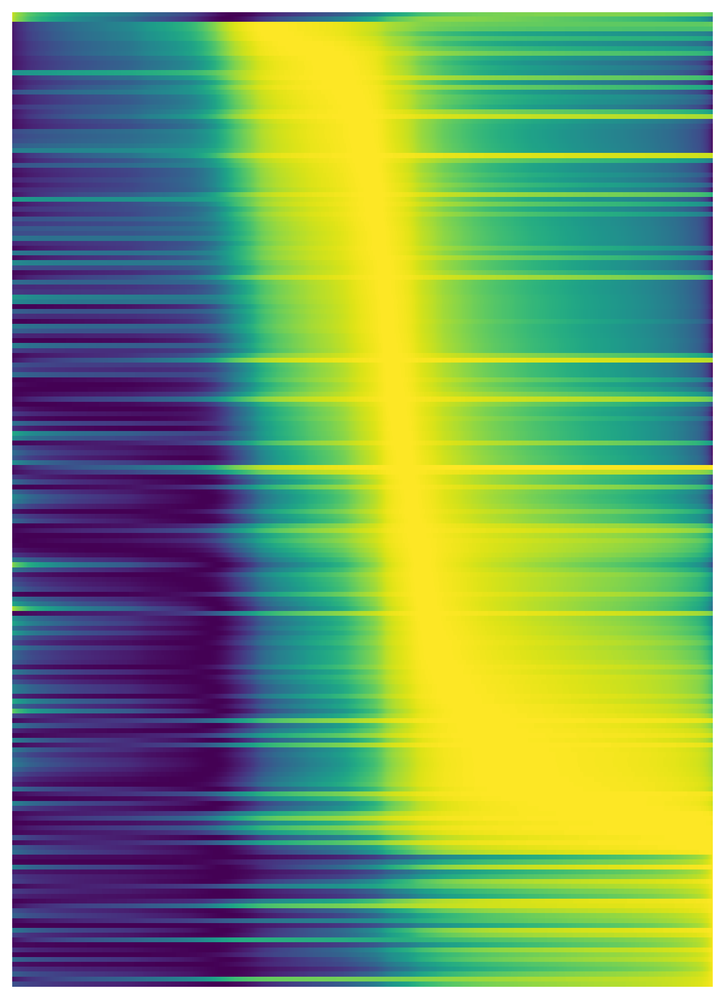

In [1171]:
g=sns.clustermap(df_fit_sort_fev.T,col_cluster=False,row_cluster=False,cmap='viridis',standard_scale=0,figsize=(10,15))
ax = g.ax_heatmap
g.cax.set_visible(False)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)

ax.set_xticks([])
ax.set_xticklabels([])
ax.set_yticks([])
ax.set_yticklabels([])
pl.title('')

pl.savefig('./fev_genes_dpt_red_new.png')
pl.show()

In [81]:
# #### plot with gene names

# g=sns.clustermap(df_fit_sort_fev.T,col_cluster=False,row_cluster=False,cmap='viridis',standard_scale=0,figsize=(15,50))
# ax = g.ax_heatmap
# g.cax.set_visible(False)
# g.ax_row_dendrogram.set_visible(False)
# g.ax_col_dendrogram.set_visible(False)

# ax.set_xticks([])
# ax.set_xticklabels([])
# pl.title('')


# pl.savefig('./fev_genes_dpt_full_new.png')
# pl.show()

### Identify specific EP signature genes 

In [916]:
### load the Gng3+ enriched genes
genes=pd.read_excel('./Table_S2.xlsx', sheet_name='Upregulated in Ngn3+')['Names'].tolist()

df=pd.DataFrame(adata_all[:,genes].copy().X.toarray(),columns=genes)


### scale from 0 to 1
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
scaled_df = scaler.fit_transform(df)
df_scale = pd.DataFrame(scaled_df, columns=df.columns,index=df.index)
df_scale['clusters']=adata_all.obs['clusters_fig3_final'].values

### compute mean per cluster
df_mean=df_scale.groupby('clusters').mean()


/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:323: DataConversionWarning: Data with input dtype float32 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


In [809]:
df_mean.shape

(13, 4830)

set thresholds to identify signature genes that are transiently expressed simlilar to Ngn3 based on the mean expression of Ngn3

In [917]:
thr=0.04
ix=[all(tup) for tup in zip(df_mean.loc['Multipotent']<thr,
                            df_mean.loc['Tip']<thr,
                            df_mean.loc['Prlf. Tip']<thr,
                            df_mean.loc['Prlf. Acinar']<thr,
                            df_mean.loc['Mat. Acinar']<thr,
                            df_mean.loc['Trunk']<thr,
                            df_mean.loc['Prlf. Trunk']<thr,
                            df_mean.loc['Ductal']<thr,
                            df_mean.loc['Prlf. Ductal']<thr,
                            df_mean.loc['Fev+']<=0.18,
                            df_mean.loc['Endocrine']<thr,
                            df_mean.loc['Ngn3 high EP']>0.04,
                           )]
genes2=df_mean.columns[ix]

In [ ]:
###reorder the genes

genes2=['Neurog3', 'Ppp1r14a', 'Sult2b1', 'Lrrn2', 'Grin3a', 'Nfix', 'Shf',
       'Gm8773', 'Plk3', 'Dll1', 'Neurod2', 'Notum', 'Krtap17-1', 'Slc39a2',
       'C2cd4c', 'Megf11', 'Rbfox3', 'Gng13', 'Steap1', 'Enc1', 'Rab15',
       'Rgs16', 'Tbc1d9', 'Lynx1', 'Epb42', 'Nptx2', 'Upk3bl', 'Cer1', 'Eya2',
       'Rsad2', 'Iffo2', 'Slco4a1', 'Slc16a5', 'Spink4', 'Nptx1', 'Pou3f1',
       'Tspear', 'Mycl', 'Ttyh2', 'Rasgrp3', 'Dab1', 'Rgs3', 'Sema3g', 'Rhbg',
       'Adamtsl2', 'Crybb1', 'Cldn12', 'Tbc1d8', 'Lgi3', 'Tff3', 'Obscn',
       'Dpysl5', 'Sftpc', 'Miat', 'Vldlr', 'Calml4', 'Kif26a', 'Cd40']

### Heatmap EP signature genes - Figure S2B

saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/matrixplot_figS5_ep_signature_scaled.pdf


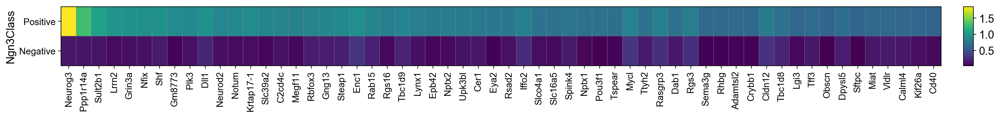

GridSpec(2, 2, height_ratios=[0, 10.5], width_ratios=[34.8, 0.4])

In [901]:
adata_ngn3_class=adata_all[np.isin(adata_all.obs['Ngn3Class'],['Positive','Negative'])].copy()
adata_ngn3_class_scales=sc.pp.scale(adata_ngn3_class,copy=True,zero_center=False)
sc.pl.matrixplot(adata_ngn3_class_scales,groupby='Ngn3Class',var_names=genes2,save='_figS5_ep_signature_scaled.pdf')

### Identify specific Ngn3 EP low signature genes

In [772]:
names = adata_all.uns['rank_genes_Ngn3+']['names']['Positive']
scores = adata_all.uns['rank_genes_Ngn3+']['scores']['Positive']
lfc = adata_all.uns['rank_genes_Ngn3+']['logfoldchanges']['Positive']
p = adata_all.uns['rank_genes_Ngn3+']['pvals']['Positive']
p_adj = adata_all.uns['rank_genes_Ngn3+']['pvals_adj']['Positive']

df=pd.DataFrame({'Names':names, 'Scores':scores,'log foldchange':lfc,'p-value':p,'adjusted p-value':p_adj})[0:500]

In [744]:
ngn3_genes=pd.read_excel('/Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Table_S2_Revision.xlsx', sheet_name='Upregulated in Ngn3+')['Names'].tolist()

df=pd.DataFrame(adata_all.X.toarray(),columns=adata_all.var_names)
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
scaled_df = scaler.fit_transform(df)
df_scale = pd.DataFrame(scaled_df, columns=df.columns,index=df.index)
df_scale['clusters']=adata_all.obs['clusters_fig3_final'].values

df_mean2=df_scale.groupby('clusters').mean()

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:323: DataConversionWarning: Data with input dtype float32 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


find a specific signature for Ngn3 EP low cells with the same approach as for Ngn3 high cells

In [613]:
thr=0.1
ix=[all(tup) for tup in zip(
                            df_mean.loc['Ngn3 high EP']<thr,

                            df_mean.loc['Ngn3 low EP']>thr,
                           )]
genes=df_mean.columns[ix]

In [771]:
thr=0.001
ix=[all(tup) for tup in zip(df_mean2.loc['Multipotent']<=thr,
                            df_mean2.loc['Tip']<=thr,
                            df_mean2.loc['Prlf. Tip']<=thr,
                            df_mean2.loc['Prlf. Acinar']<=thr,
                            df_mean2.loc['Mat. Acinar']<=thr,
                            df_mean2.loc['Trunk']<=thr,
                            df_mean2.loc['Prlf. Trunk']<=thr,
                            df_mean2.loc['Ductal']<=thr,
                            df_mean2.loc['Prlf. Ductal']<=thr,
                            df_mean2.loc['Fev+']<=thr,
                            df_mean2.loc['Endocrine']<=thr,
                            df_mean2.loc['Ngn3 high EP']>0.005
                           )]
genes=df_mean2.columns[ix]
genes

Index(['Gm6086', 'Gm28209', 'Zbp1', 'Bhlhe23', 'Frmpd3', 'Arsj', 'Sdr16c6',
       'Adra2c', 'Aoc1', 'Mrvi1', 'Mrgprf', 'Il27ra', 'Calb2', 'Krt33b',
       'Slc4a1', 'Endou'],
      dtype='object', name='index')

In [650]:
thr=0.01
ix=[all(tup) for tup in zip(df_mean.loc['Multipotent']<thr,
                            df_mean.loc['Tip']<thr,
                            df_mean.loc['Prlf. Tip']<thr,
                            df_mean.loc['Prlf. Acinar']<thr,
                            df_mean.loc['Mat. Acinar']<thr,
                            df_mean.loc['Trunk']<thr,
                            df_mean.loc['Prlf. Trunk']<thr,
                            df_mean.loc['Ductal']<thr,
                            df_mean.loc['Prlf. Ductal']<thr,
                            df_mean.loc['Fev+']<thr,
                            df_mean.loc['Endocrine']<thr,
                            #df_mean.loc['Ngn3 high EP']<thr,

                            df_mean.loc['Ngn3 low EP']>thr,
                           )]
genes=df_mean.columns[ix]

we do not find a very distinct profile for Ngn3 low EPs

### Lineplots for signature gene expression along pseudotime - Figure 5C-E, S2E

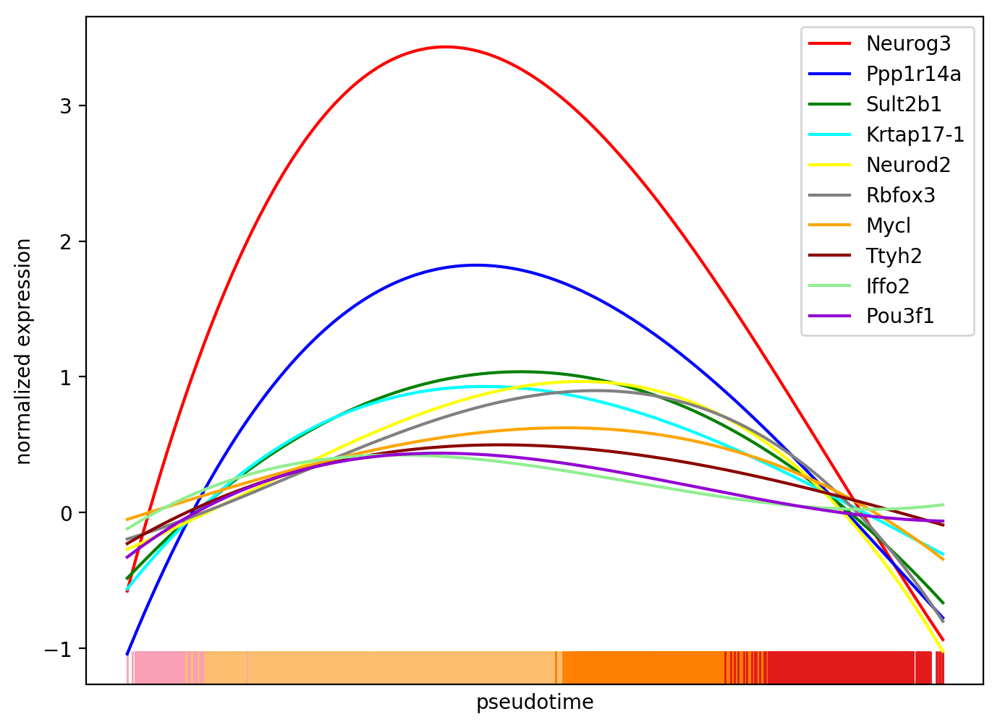

In [1138]:
genes=['Neurog3', 'Ppp1r14a', 'Sult2b1','Krtap17-1','Neurod2','Rbfox3','Mycl','Ttyh2','Iffo2', 'Pou3f1']
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)

rcParams['figure.figsize'] = (8, 6)

fig,ax=pl.subplots()

cols=['red','blue','green','cyan','yellow','grey','orange','darkred','lightgreen','darkviolet','sienna','peru','magenta','darkgreen','darkseagreen','palevioletred',
     'cornflowerblue','lightsalmon']

for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
for i,clust in enumerate(adata_sub.obs['clusters_fig3_final'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color=col_clust[i])

ax.set_xticks([])
ax.set_xticklabels([])
pl.ylabel('normalized expression')
    

pl.savefig('./ep_signature_lineplot_paper_1_new.pdf',format='pdf',dpi=300)

pl.show()

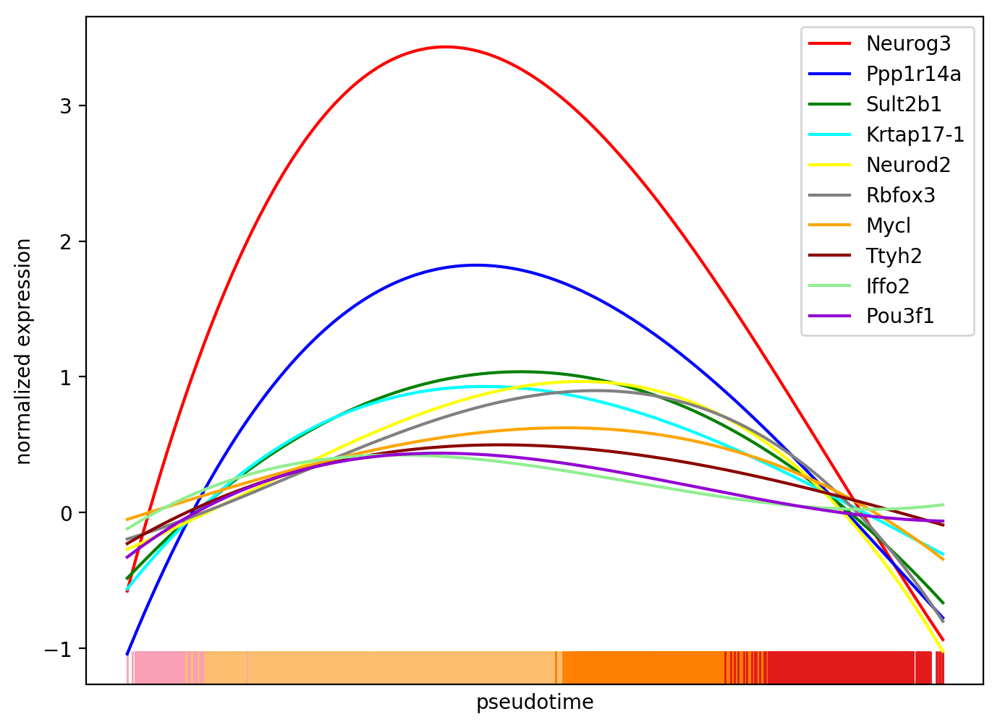

In [1152]:
genes=['Neurog3', 'Ppp1r14a', 'Sult2b1','Krtap17-1','Neurod2','Rbfox3','Mycl','Ttyh2','Iffo2', 'Pou3f1']
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)


rcParams['figure.figsize'] = (8, 6)

fig,ax=pl.subplots()

cols=['red','blue','green','cyan','yellow','grey','orange','darkred','lightgreen','darkviolet','sienna','peru','magenta','darkgreen','darkseagreen','palevioletred',
     'cornflowerblue','lightsalmon']

for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
for i,clust in enumerate(adata_sub.obs['clusters_fig3_final'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color=col_clust[i])

ax.set_xticks([])
ax.set_xticklabels([])
pl.ylabel('normalized expression')
    

pl.savefig('./ep_signature_lineplot_paper_1_new.png',format='png',dpi=300)

pl.show()

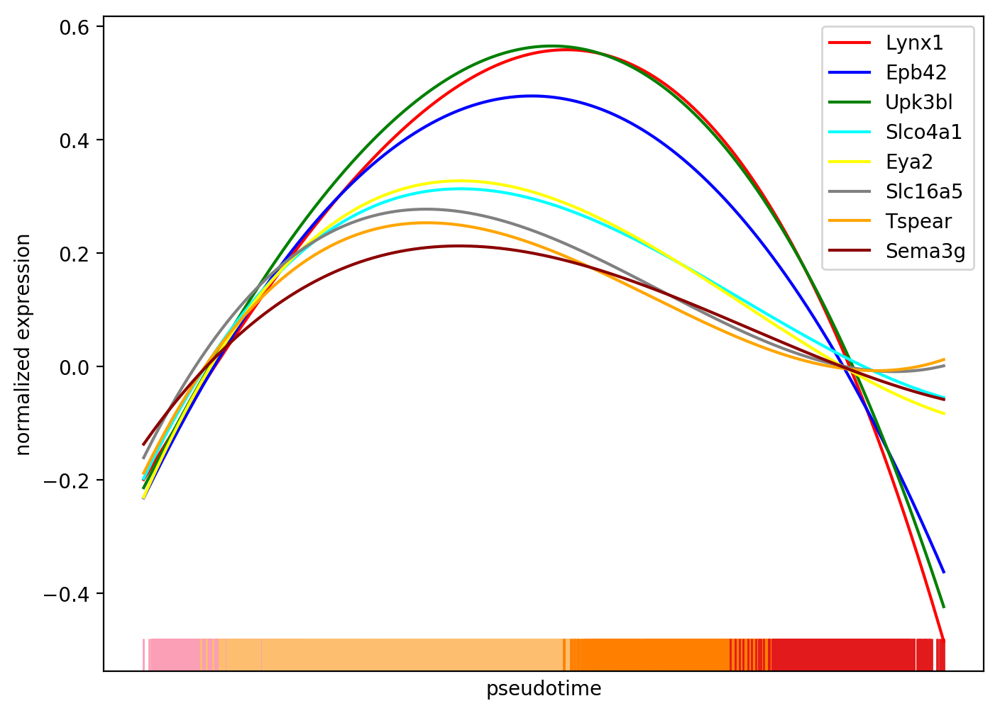

In [1139]:
genes=['Lynx1','Epb42','Upk3bl','Slco4a1',
      'Eya2','Slc16a5','Tspear','Sema3g']
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)

rcParams['figure.figsize'] = (8, 6)

fig,ax=pl.subplots()

cols=['red','blue','green','cyan','yellow','grey','orange','darkred','lightgreen','darkviolet','sienna','peru','magenta','darkgreen','darkseagreen','palevioletred',
     'cornflowerblue','lightsalmon']

for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
    
for i,clust in enumerate(adata_sub.obs['clusters_fig3_final'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color=col_clust[i])

pl.ylabel('normalized expression')
ax.set_xticks([])
ax.set_xticklabels([])

pl.savefig('./ep_signature_lineplot_paper_2_new.pdf',format='pdf',dpi=300)

pl.show()

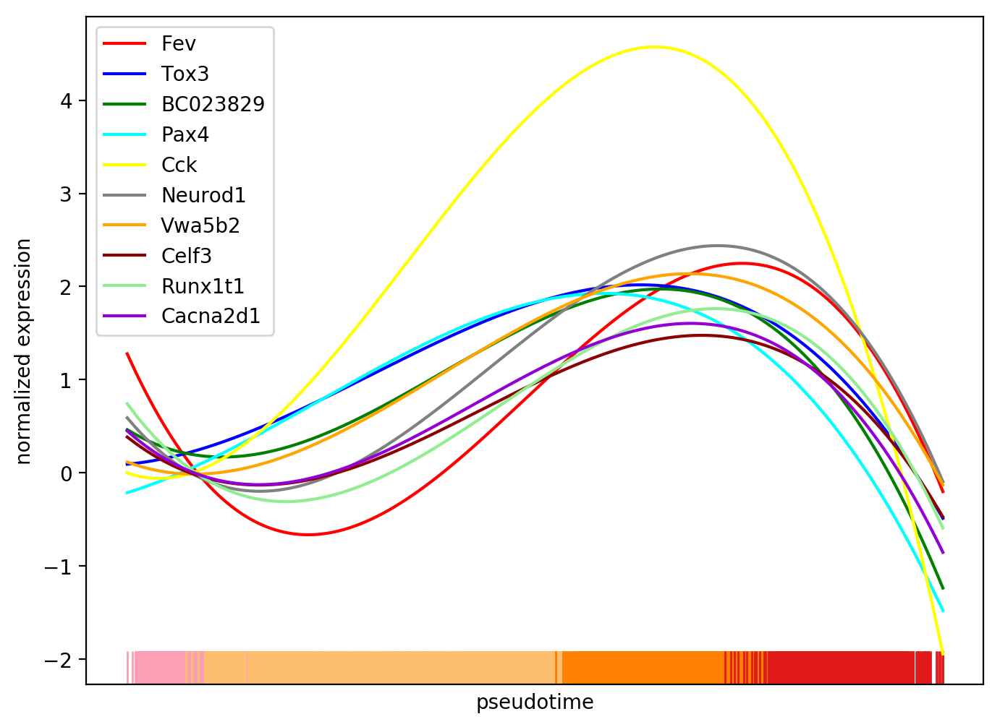

In [1140]:
genes=['Fev','Tox3','BC023829','Pax4','Cck','Neurod1','Vwa5b2','Celf3','Runx1t1','Cacna2d1']
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)

rcParams['figure.figsize'] = (8, 6)

fig,ax=pl.subplots()

cols=['red','blue','green','cyan','yellow','grey','orange','darkred','lightgreen','darkviolet','sienna','peru','magenta','darkseagreen','palevioletred',
     'cornflowerblue','lightsalmon']

for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
    
    
for i,clust in enumerate(adata_sub.obs['clusters_fig3_final'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color=col_clust[i])

pl.ylabel('normalized expression')
ax.set_xticks([])
ax.set_xticklabels([])

pl.savefig('./fev_signature_lineplot_paper_new.pdf',format='pdf',dpi=300)

pl.show()

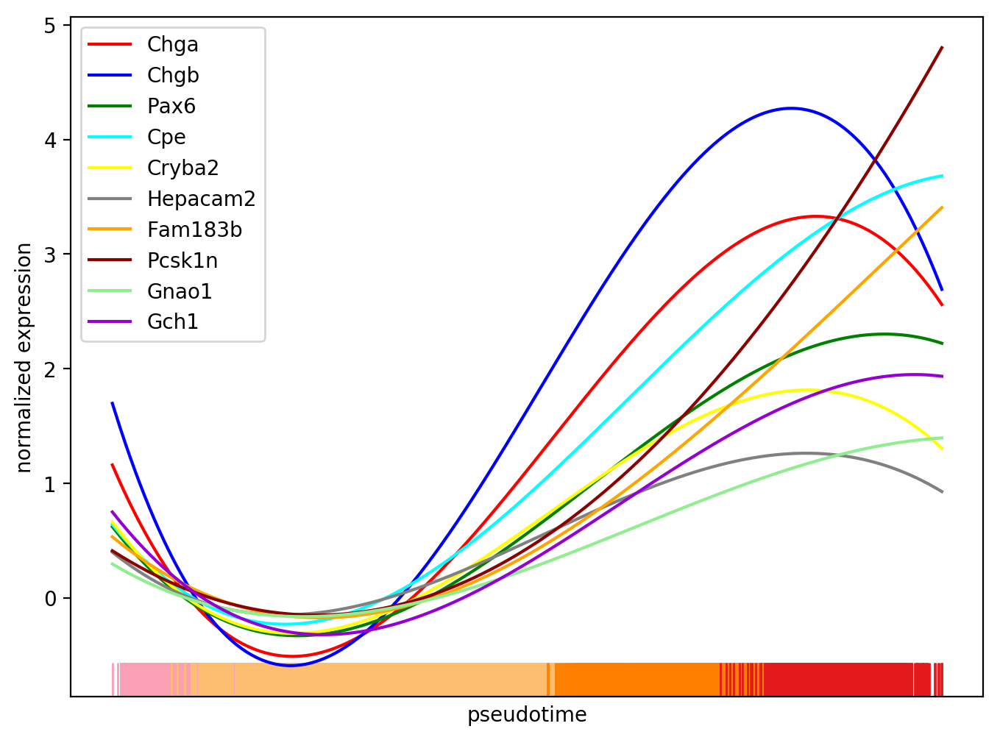

In [1141]:
genes=['Chga',
 'Chgb',
 'Pax6','Cpe','Cryba2',
 'Hepacam2',
 'Fam183b',
 'Pcsk1n',
 'Gnao1',
 'Gch1']
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)

fig,ax=pl.subplots()
rcParams['figure.figsize'] = (8, 6)

cols=['red','blue','green','cyan','yellow','grey','orange','darkred','lightgreen','darkviolet','sienna','peru','magenta','darkseagreen','palevioletred',
     'cornflowerblue','lightsalmon']

for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
    
    
    
for i,clust in enumerate(adata_sub.obs['clusters_fig3_final'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color=col_clust[i])

pl.ylabel('normalized expression')
ax.set_xticks([])
ax.set_xticklabels([])

pl.savefig('./endocrine_genes_lineplot_paper_new.pdf',format='pdf',dpi=300)

pl.show()

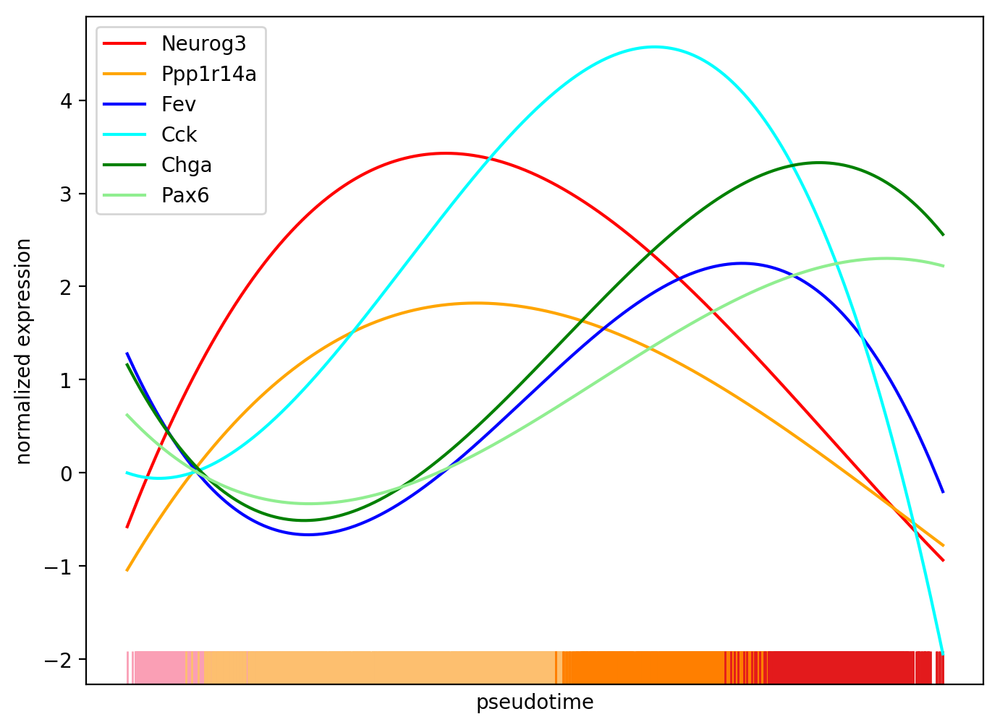

In [1142]:
genes=['Neurog3','Ppp1r14a','Fev','Cck','Chga','Pax6']
df=pd.DataFrame(adata_sub[:,genes].copy().X.toarray(),columns=genes)
df['pseudotime']=adata_sub.obs['dpt_pseudotime'].values
df['clusters']=adata_sub.obs['clusters_fig3_final'].values

df=df.sort_values(by='pseudotime',ascending=True)

fig,ax=pl.subplots()
rcParams['figure.figsize'] = (8, 6)

cols=['red','orange','blue','cyan','green','lightgreen','darkred','lightgreen','darkviolet','sienna','peru','magenta','darkseagreen','palevioletred',
     'cornflowerblue','lightsalmon']

for i,gene in enumerate(genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
      
    
for i,clust in enumerate(adata_sub.obs['clusters_fig3_final'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color=col_clust[i])

pl.ylabel('normalized expression')
ax.set_xticks([])
ax.set_xticklabels([])

pl.savefig('./all_signature_lineplot_paper_new.pdf',format='pdf',dpi=300)

pl.show()

## Gene sets along pseudotime - Figure 5E

In [26]:
adata_sub_2_hvg=adata_hvg[np.isin(adata_hvg.obs['clusters_fig4_final'],['Ductal Bipotent', 'Ngn3 low EP', 'Ngn3 high EP','Fev+'])].copy()

In [27]:
adata_sub_2=adata_all[np.isin(adata_hvg.obs['clusters_fig4_final'],['Ductal Bipotent', 'Ngn3 low EP', 'Ngn3 high EP','Fev+'])].copy()

In [28]:
sc.pp.neighbors(adata_sub_2_hvg)
sc.tl.diffmap(adata_sub_2_hvg)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:22.56) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.         0.99870044 0.9925187  0.989291   0.98538524 0.98120636
     0.97937906 0.9744214  0.97351044 0.9662149  0.9623577  0.95873713
     0.956959   0.95521986 0.951615  ]
    finished (0:00:01.33) --> added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns)


In [30]:
adata_sub_2_hvg.uns['iroot'] = np.flatnonzero(np.array([all(tup) for tup in zip(adata_sub_2_hvg.obs['clusters_fig4_final'] == 'Ductal Bipotent')]))[0]
sc.tl.dpt(adata_sub_2_hvg,n_dcs=10)

computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00.00) --> added
    'dpt_pseudotime', the pseudotime (adata.obs)


In [31]:
adata_sub_2.obs['dpt_pseudotime']=adata_sub_2_hvg.obs['dpt_pseudotime']

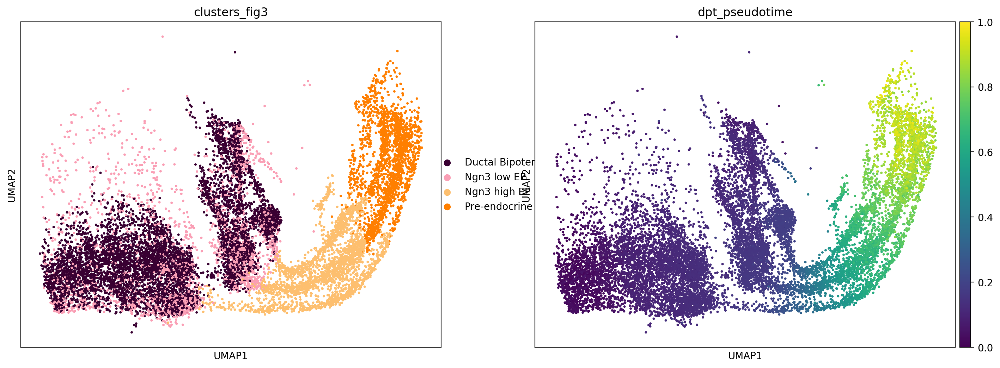

In [1102]:

sc.pl.umap(adata_sub_2_hvg,color=['clusters_fig4_final','dpt_pseudotime'])

we manually select relevant genes from Table S3

In [33]:
genes_duct=['Fen1',
 'Lig1',
 'Rpa2',
 'Pole4',
 'Pold3',
 'Pola2',
 'Pole2',
 'Pold2',
 'Pcna',
 'Mcm7',
 'Mcm3',
 'Mcm5',
 'Mcm6',
 'Mcm2',
 'Ccne1',
 'Cdc6',
 'Ccnd2',
 'Ccnd1',
 'Jun',
 'Cacybp']

genes_ngnlow=['Snai2',
 'Ptprf',
 'Pard3',
 'Actb',
 'Actg1',
 'Pdgfa',
 'Calm1',
 'Rasgrp3',
 'Pard3',
 'F11r',
 'Actb',
 'Actg1',
 'Dll4',
 'Lfng',
 'Numbl',
 'Notch1',
 'Dll1',
 'Hes6',
 'Pla2g2f',
 'Calm1',
 'Gng13',
 'Pdgfa',
 'Rasgrp3',
 'Dusp10',
 'Gadd45a',
 'Gadd45g',
 'Cdc25b',
 'Cdkn1a',
 'Btg2',
 'Calm1',
 'Ffar2',
 'Grin3a',
 'Ptch1',
 'Fxyd2']
genes_ngnhigh=['Cer1',
 'Notum',
 'Atp6v1g1',
 'Atp6v0b',
 'Stxbp1',
 'Clta',
 'Cplx2',
 'Gabarapl2',
 'Plk3',
 'Gabarap',
 'Cdkn1a',
 'Gadd45a',
 'Gadd45g',
 'Cdk4',
 'Cdc14b',
 'Ppp3ca',
 'Hspa8',
 'Jund',
 'Gadd45a',
 'Cacna2d1',
 'Gadd45g']


genes_preendo=['Gnb2',
 'Trpc1',
 'Cacna1a',
 'Gng12',
 'Glul',
 'Gabarapl2',
 'Hap1',
 'Gabarap',
 'Slc38a5',
 'Ddc',
 'Trpc1',
 'Ppp2r5b',
 'Atp6v0b',
 'Cltb',
 'Atp6v1b2',
 'Atp6v0d1',
 'Ap2m1',
 'Vamp2',
 'Snap25',
 'Rab3a',
 'Abcc8',
 'Pdx1',
 'Gjd2',
 'Tuba1a',
 'Gnas',
 'Gnai1',
 'Gnai2']

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]


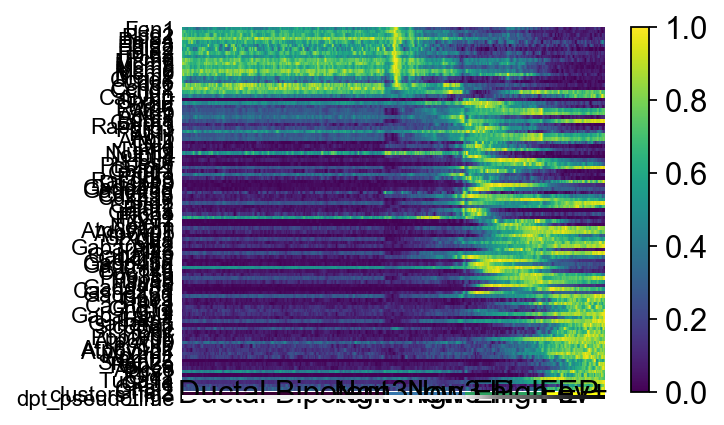

In [34]:
### we first create a smoothed data using the smoothing and scaling from sc.pl.paga_path

adata_show=adata_sub_2.copy()
paths = [('endocrine lineage', ['Ductal Bipotent', 'Ngn3 low EP', 'Ngn3 high EP','Fev+'])]
        
# randomly shuffle ductal pseudotime values as for many ductal genes we find a gradient corresponding to ductal maturation, but we do not want to show it here.
import random
x=adata_show.obs['dpt_pseudotime'][np.isin(adata_show.obs['clusters_fig4_final'],'Ductal Bipotent')].copy()
random.shuffle(x)
adata_show.obs['dpt_pseudotime'][np.isin(adata_show.obs['clusters_fig4_final'],'Ductal Bipotent')]=x.values

rcParams['figure.figsize'] = (5, 3)
for ipath, (descr, path) in enumerate(paths):
    _, axs = pl.subplots()    
    ax,data = sc.pl.paga_path(adata_show, left_margin=0.3,color_map='viridis',groups_key='clusters_fig4_final',return_data=True,

                        nodes=path,ax=axs,
                        ytick_fontsize=10,
                        keys=gene_names,
                        n_avg=80,
                        normalize_to_zero_one=True, show=False)
    pl.show()
pl.rcParams.update(pl.rcParamsDefault)


In [35]:
## calculate cluster ratios for heatmap sizes
ratios=np.array([2,len(genes_duct),len(genes_ngnlow),len(genes_ngnhigh),len(genes_preendo)])
ratios=ratios/min(ratios)

In [36]:
## remove duplicated gene columns
data_sub=data.loc[:,~data.columns.duplicated()]

In [37]:
col_clust_2=['#390032','#fa9fb5', '#fdbf6f', '#ff7f00']

In [38]:
## cluster annotations
data_sub['groups_round']=np.round(data_sub['groups']).values

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


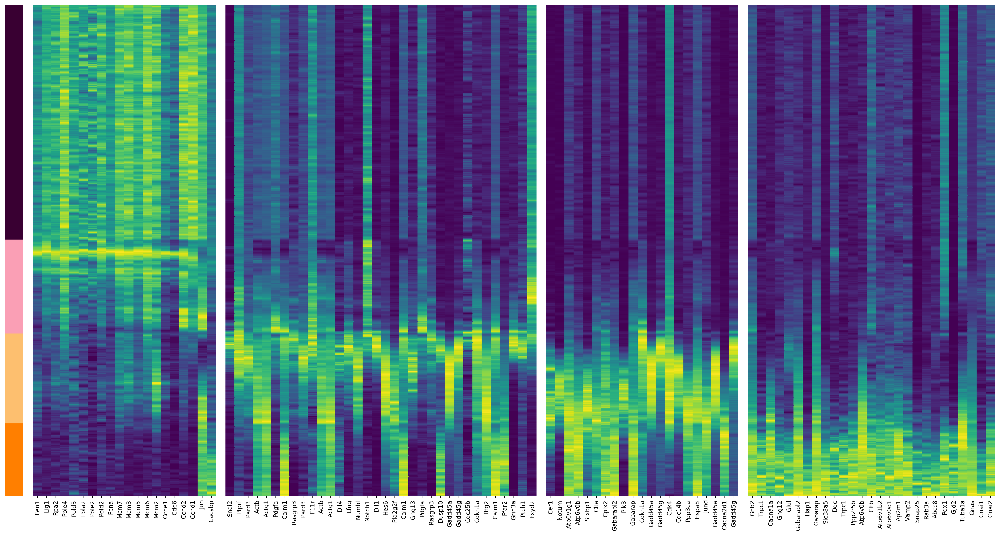

In [40]:
## input smoothed values into heatmap

rcParams['figure.figsize'] = (30, 15)
fig,axs=pl.subplots(ncols=5,gridspec_kw={'wspace': 0.05,'width_ratios':ratios})
sns.heatmap(data_sub.loc[:,['groups_round']], cmap=col_clust_2, ax=axs[0], cbar=False)
axs[0].set_yticks([])
axs[0].set_yticklabels([])
axs[0].set_xticks([])
axs[0].set_xticklabels([])
sns.heatmap(data_sub[genes_duct],cmap='viridis',ax=axs[1],cbar=None)
axs[1].set_yticks([])
axs[1].set_yticklabels([])
sns.heatmap(data_sub[genes_ngnlow],cmap='viridis',ax=axs[2],cbar=None)
axs[2].set_yticks([])
axs[2].set_yticklabels([])
sns.heatmap(data_sub[genes_ngnhigh],cmap='viridis',ax=axs[3],cbar=None)
axs[3].set_yticks([])
axs[3].set_yticklabels([])
sns.heatmap(data_sub[genes_preendo],cmap='viridis',ax=axs[4],cbar=None)

axs[4].set_yticks([])
axs[4].set_yticklabels([])
axs[0].axis('tight')
axs[1].axis('tight')

axs[2].axis('tight')
axs[3].axis('tight')
axs[4].axis('tight')

## Cell cycle effects on pseudotime

To test whether cell cycle effects mask other biological processes and affect the pseudotemporal ordering, dpt was recomputed after linearly regressing out S and G2M cell scores (using sc.pp.regress_out, data not shown). Removal of cell cycle effects did not considerably change the ordering of the cells. Also, the expression of genes described in the manuscript figures was not affected except for, as expected, genes involved in DNA replication and cell cycle.

In [555]:
adata_hvg.obs['S_score']=adata_all.obs['S_score']
adata_hvg.obs['G2M_score']=adata_all.obs['G2M_score']

In [62]:
## Note: the regression requires much memory!
adata_all_reg=adata_all.copy()
sc.pp.filter_genes(adata_all_reg,min_counts=1)
sc.pp.regress_out(adata_all_reg,['S_score','G2M_score'])

In [63]:
adata_hvg_reg=adata_all_reg[:,np.isin(adata_all_reg.var_names,adata_hvg.var_names)].copy()

In [64]:
adata_sub_reg_hvg=adata_hvg_reg[np.isin(adata_all.obs['clusters_fig3_final'],['Ngn3 low EP',
       'Ngn3 high EP', 'Fev+', 'Endocrine'])].copy()

In [ ]:
del adata_sub_reg_hvg.obsm['X_diffmap']

In [81]:
sc.pp.neighbors(adata_sub_reg_hvg)
sc.tl.diffmap(adata_sub_reg_hvg)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:04.45) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.         0.99858916 0.9937478  0.98622906 0.9845617  0.9809435
     0.97522    0.97178245 0.96935576 0.9671802  0.9663954  0.963457
     0.96182746 0.9614592  0.9605147 ]
    finished (0:00:00.41) --> added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns)


In [83]:
adata_sub_reg_hvg.uns['iroot']=adata_sub_hvg.uns['iroot']
sc.tl.dpt(adata_sub_reg_hvg)

computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00.00) --> added
    'dpt_pseudotime', the pseudotime (adata.obs)


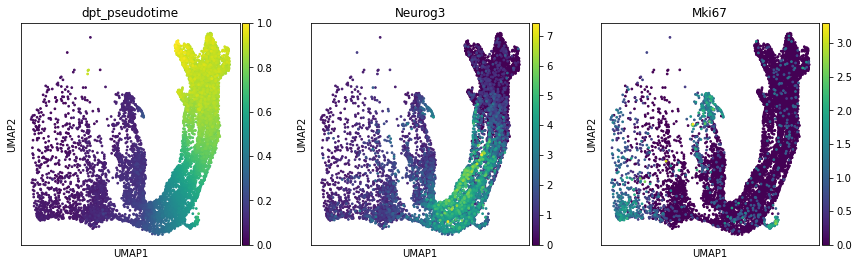

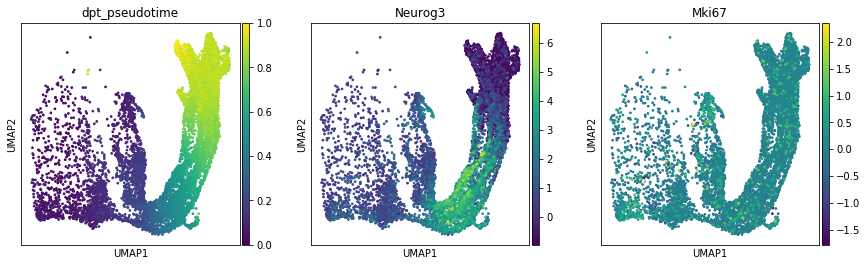

In [105]:
sc.pl.umap(adata_sub_hvg,color=['dpt_pseudotime','Neurog3','Mki67'])
sc.pl.umap(adata_sub_reg_hvg,color=['dpt_pseudotime','Neurog3','Mki67'])

In [107]:
adata_sub_reg_2_hvg=adata_hvg_reg[np.isin(adata_all.obs['clusters_fig4_final'],['Ductal Bipotent', 'Ngn3 low EP', 'Ngn3 high EP','Fev+'])].copy()
adata_sub_reg_2=adata_all_reg[np.isin(adata_all.obs['clusters_fig4_final'],['Ductal Bipotent', 'Ngn3 low EP', 'Ngn3 high EP','Fev+'])].copy()

In [109]:
del adata_sub_reg_2_hvg.obsm['X_diffmap']
sc.pp.neighbors(adata_sub_reg_2_hvg)
sc.tl.diffmap(adata_sub_reg_2_hvg)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:05.40) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.         0.9983755  0.9923503  0.9903063  0.9865713  0.97954315
     0.97728586 0.9766605  0.97494936 0.9719598  0.9703856  0.9694326
     0.96734536 0.9654066  0.96106404]
    finished (0:00:00.78) --> added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns)


In [110]:
adata_sub_reg_2_hvg.uns['iroot']=adata_sub_2_hvg.uns['iroot']
sc.tl.dpt(adata_sub_reg_2_hvg)
adata_sub_reg_2.obs['dpt_pseudotime']=adata_sub_reg_2_hvg.obs['dpt_pseudotime']

computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00.00) --> added
    'dpt_pseudotime', the pseudotime (adata.obs)


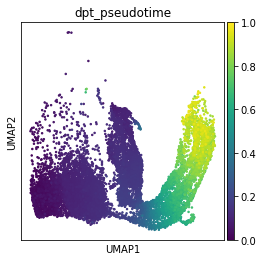

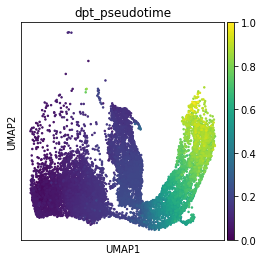

In [111]:
sc.pl.umap(adata_sub_2_hvg,color='dpt_pseudotime')
sc.pl.umap(adata_sub_reg_2_hvg,color='dpt_pseudotime')

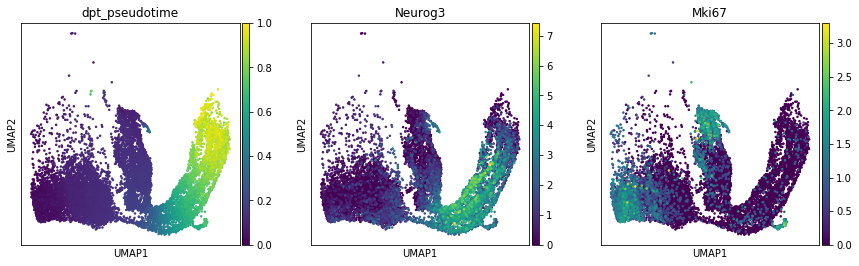

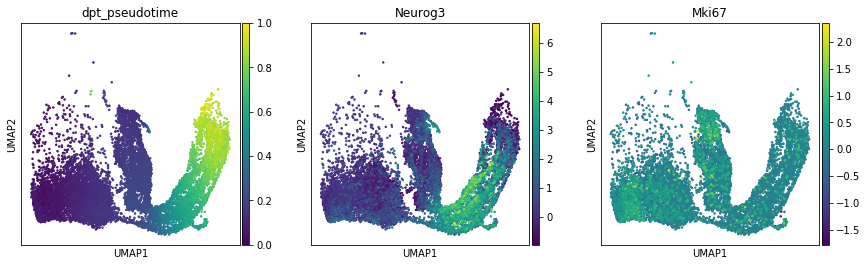

In [112]:
sc.pl.umap(adata_sub_2_hvg,color=['dpt_pseudotime','Neurog3','Mki67'])
sc.pl.umap(adata_sub_reg_2_hvg,color=['dpt_pseudotime','Neurog3','Mki67'])

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]


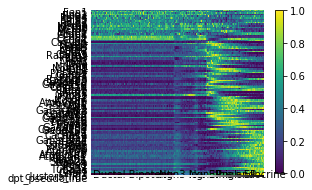

In [118]:
adata_show=adata_sub_reg_2.copy()



paths = [('endocrine lineage', ['Ductal Bipotent', 'Ngn3 low EP', 'Ngn3 high EP','Fev+'])]
         
         #('Goblet', ['1,0,0,0','9,0,1,0','4,0,0,0','2,0,0,0','7,0,0,0']),
         #('EEC', ['1,0,0,0','11,0,0,2','9,0,2,0','5,0,0,0','11,0,0,3','11,0,0,1'])]
import random

x=adata_show.obs['dpt_pseudotime'][np.isin(adata_show.obs['clusters_fig4_final'],'Ductal Bipotent')].copy()
random.shuffle(x)
adata_show.obs['dpt_pseudotime'][np.isin(adata_show.obs['clusters_fig4_final'],'Ductal Bipotent')]=x.values



rcParams['figure.figsize'] = (5, 3)
for ipath, (descr, path) in enumerate(paths):

    _, axs = pl.subplots()
    
    ax,data = sc.pl.paga_path(adata_show, left_margin=0.3,color_map='viridis',groups_key='clusters_fig4_final',return_data=True,

                        nodes=path,ax=axs,
                        ytick_fontsize=10,
                        keys=gene_names,
                        n_avg=80,
                        normalize_to_zero_one=True, show=False)

    pl.show()





pl.rcParams.update(pl.rcParamsDefault)



In [119]:
ratios=np.array([2,len(genes_duct),len(genes_ngnlow),len(genes_ngnhigh),len(genes_preendo)])
ratios=ratios/min(ratios)

data_sub=data.loc[:,~data.columns.duplicated()]
col_clust_2=['#390032','#fa9fb5', '#fdbf6f', '#ff7f00']
data_sub['groups_round']=np.round(data_sub['groups']).values


/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


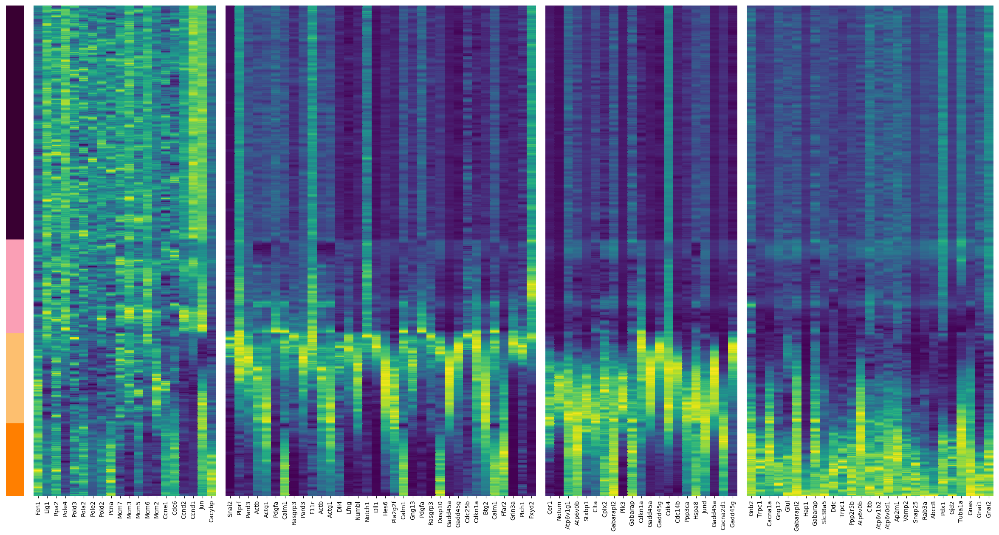

In [121]:
rcParams['figure.figsize'] = (30, 15)
fig,axs=pl.subplots(ncols=5,gridspec_kw={'wspace': 0.05,'width_ratios':ratios})
sns.heatmap(data_sub.loc[:,['groups_round']], cmap=col_clust_2, ax=axs[0], cbar=False)
axs[0].set_yticks([])
axs[0].set_yticklabels([])
axs[0].set_xticks([])
axs[0].set_xticklabels([])
sns.heatmap(data_sub[genes_duct],cmap='viridis',ax=axs[1],cbar=None)
axs[1].set_yticks([])
axs[1].set_yticklabels([])
sns.heatmap(data_sub[genes_ngnlow],cmap='viridis',ax=axs[2],cbar=None)
axs[2].set_yticks([])
axs[2].set_yticklabels([])
sns.heatmap(data_sub[genes_ngnhigh],cmap='viridis',ax=axs[3],cbar=None)
axs[3].set_yticks([])
axs[3].set_yticklabels([])
sns.heatmap(data_sub[genes_preendo],cmap='viridis',ax=axs[4],cbar=None)

axs[4].set_yticks([])
axs[4].set_yticklabels([])
axs[0].axis('tight')
axs[1].axis('tight')

axs[2].axis('tight')
axs[3].axis('tight')
axs[4].axis('tight')

pl.savefig('/Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/fig5_gene_sets_heatmap_2_cc_regression.png',dpi=150)

# EP specification and heterogeneity

## Heterogeneity in Ngn3 low EPs - Figure 4E,F

annotate Ngn3 low EPs based on origin

In [81]:
ref_cluster=pd.Categorical(adata_hvg.obs['clusters_fig2_final'],categories=['Multipotent', 'Tip', 'Acinar', 'Trunk', 'Ductal', 'EP', 'Fev+','Endocrine',
                                                                      'Ngn3 low EP (MPC)','Ngn3 low EP (Tip)','Ngn3 low EP (Trunk)','Ngn3 low EP (Ductal)','Ngn3 high EP'])

ref_cluster2=adata_hvg.obs['clusters_fig3_final']
ref_cluster3=adata_hvg.obs['clusters_fig3_final_noep']

ix=np.isin(ref_cluster,['EP'])
ref_cluster[ix]='Ngn3 high EP'

ix=((np.isin(ref_cluster2,['Ngn3 low EP']))&(np.isin(ref_cluster3,['Multipotent'])))
ref_cluster[ix]='Ngn3 low EP (MPC)'

ix=((np.isin(ref_cluster2,['Ngn3 low EP']))&(np.isin(ref_cluster3,['Tip','Prlf. Tip'])))
ref_cluster[ix]='Ngn3 low EP (Tip)'

ix=((np.isin(ref_cluster2,['Ngn3 low EP']))&(np.isin(ref_cluster3,['Trunk','Prlf. Trunk'])))
ref_cluster[ix]='Ngn3 low EP (Trunk)'

ix=((np.isin(ref_cluster2,['Ngn3 low EP']))&(np.isin(ref_cluster3,['Ductal','Prlf. Ductal'])))

ref_cluster[ix]='Ngn3 low EP (Ductal)'

ix=np.isin(ref_cluster,['EP'])
ref_cluster[ix]='Ngn3 high EP'

adata_hvg.obs['clusters_fig4_eplow']=ref_cluster

In [867]:
adata_all.obs['clusters_fig4_eplow']=adata_hvg.obs['clusters_fig4_eplow']

In [870]:
adata_eplow=adata_all[np.isin(adata_all.obs['clusters_fig4_eplow'],['Ngn3 low EP (MPC)','Ngn3 low EP (Tip)','Ngn3 low EP (Trunk)','Ngn3 low EP (Ductal)'])].copy()

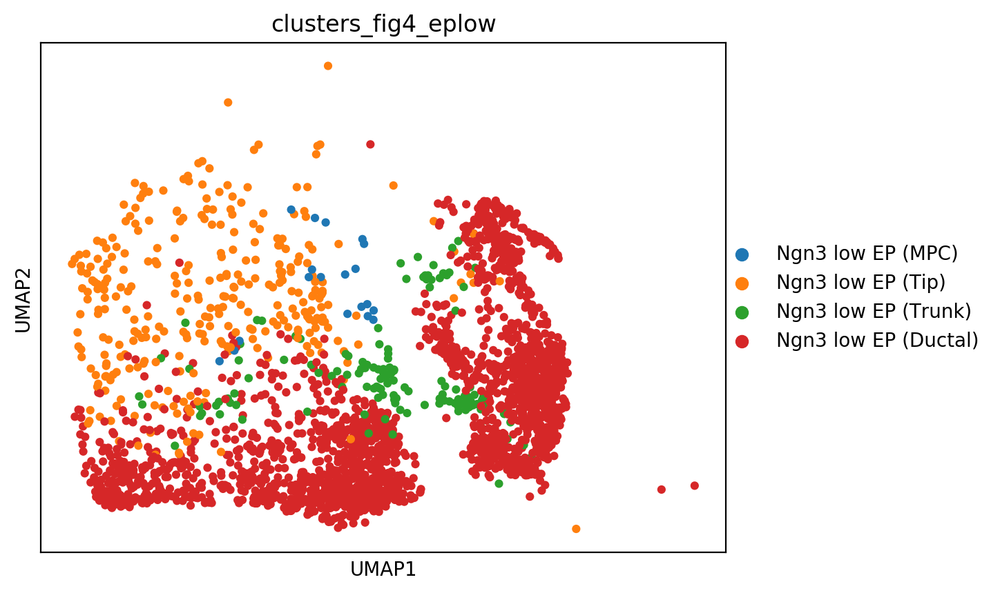

In [876]:
sc.pl.umap(adata_eplow,color='clusters_fig4_eplow')

In [866]:
### enriched genes in Ngn3+ cells
ngn3_genes=pd.read_excel('./Table_S2.xlsx', sheet_name='Upregulated in Ngn3+')['Names'].tolist()

sort genes based on expression in Ngn3 low EP

In [872]:
obs_df=pd.DataFrame(adata_eplow.X.toarray(),columns=adata_eplow.var_names)
tot=pd.DataFrame(obs_df[ngn3_genes].apply(np.mean))
tot=tot.sort_values(by=0,ascending=False)

plot top 100 ranked genes for Ngn3 low EP split by origin or by day

saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/matrixplot_heatmap_ngnlow_origin_1.pdf


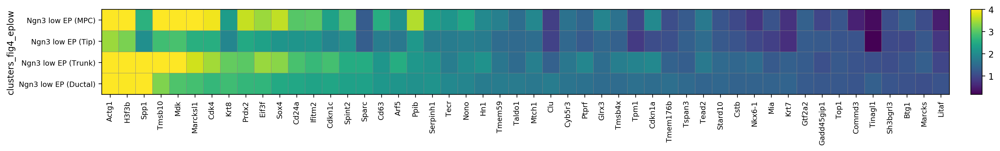

saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/matrixplot_heatmap_ngnlow_origin_2.pdf


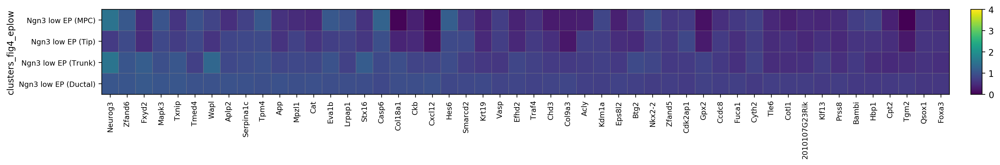

saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/matrixplot_heatmap_ngnlow_day_1.pdf


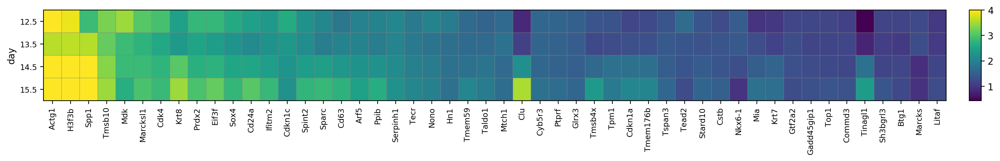

saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/matrixplot_heatmap_ngnlow_day_2.pdf


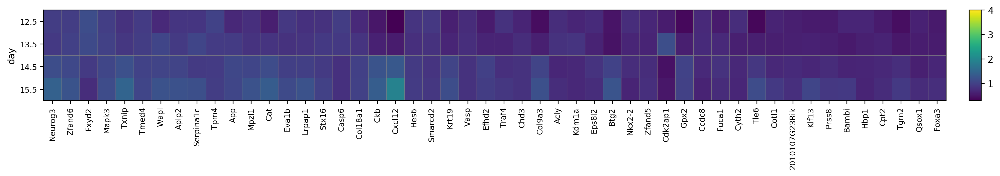

GridSpec(2, 2, height_ratios=[0, 10.5], width_ratios=[30.0, 0.4])

In [877]:

sc.pl.matrixplot(adata_eplow, tot.index[0:50], groupby='clusters_fig4_eplow',vmax=4,save='_heatmap_ngnlow_origin_1.pdf')
sc.pl.matrixplot(adata_eplow, tot.index[50:100], groupby='clusters_fig4_eplow',vmax=4,save='_heatmap_ngnlow_origin_2.pdf')
sc.pl.matrixplot(adata_eplow, tot.index[0:50], groupby='day',vmax=4,save='_heatmap_ngnlow_day_1.pdf')
sc.pl.matrixplot(adata_eplow, tot.index[50:100], groupby='day',vmax=4,save='_heatmap_ngnlow_day_2.pdf')

## Endocrine cell composition per day - Figure 6A

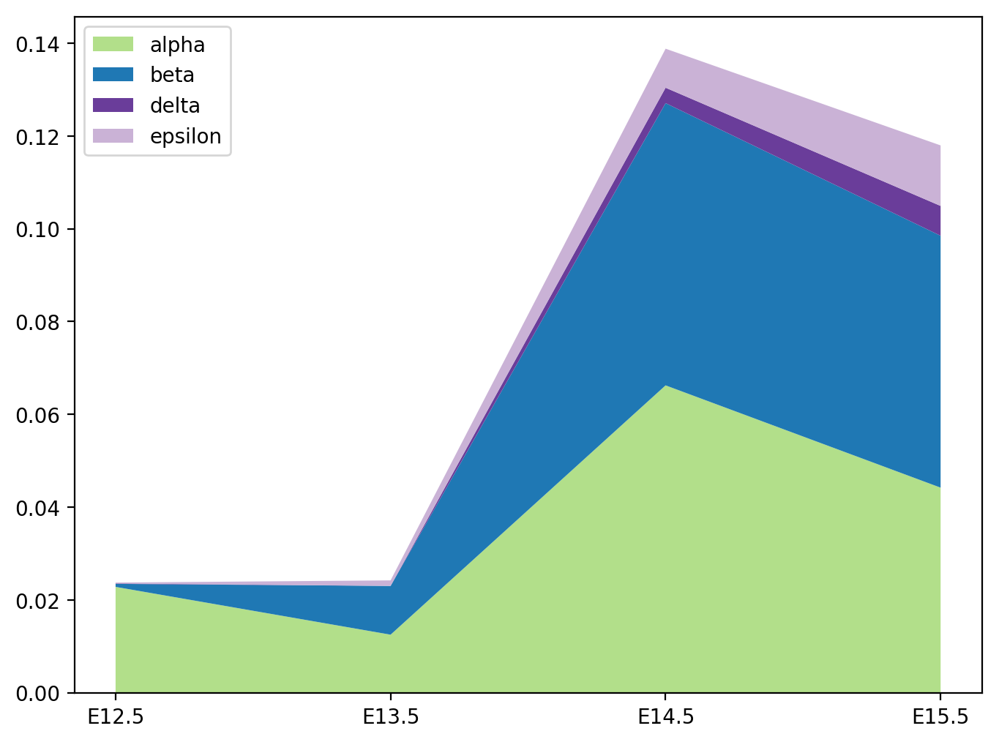

In [1188]:
group='clusters_fig6_broad_final'  #### the annotation of the different clusters/groups (on x axis)

groups_to_show=adata_hvg.obs[group].cat.categories  ### adata.obs[group].cat.categories if all groups

hue_group='day'  #### the annotation to sort by within the groups

df=pd.crosstab(columns=adata_hvg.obs[group],index=adata_hvg.obs[hue_group],normalize='index')
df=df.unstack().reset_index()
df=pd.DataFrame(df.values,columns=[group,hue_group,'values'])
x=range(1,5)
a=df['values'][52:56].values
b=df['values'][48:52].values
d=df['values'][56:60].values
e=df['values'][60:65].values

y=[list(a), list(b), list(d), list(e)]
ax=pl.subplot()
# Plot
pl.stackplot(x,y, labels=['alpha','beta','delta','epsilon'],colors=['#b2df8a', '#1f78b4', '#6a3d9a', '#cab2d6'])#"zero", "sym", "wiggle", "weighted_wiggle"
pl.legend(loc='upper left')
pl.xticks([1,2,3,4])
ax.set_xticklabels(['E12.5','E13.5','E14.5','E15.5'])
pl.show()

## Heterogeneity in lineage determining genes

### UMAP plots - Figure 6C

In [201]:
## subset the data to endocrine lineage

adata_hvg_endo=adata_hvg[np.isin(adata_hvg.obs['clusters_fig3_final'],['Ngn3 low EP',
       'Ngn3 high EP', 'Pre-endocrine', 'Endocrine'])].copy()

In [164]:
colors_endo=['#fa9fb5', '#fdbf6f', '#ff7f00',
       '#b2df8a', '#1f78b4', '#6a3d9a', '#cab2d6']

In [202]:
adata_hvg_15_endo=adata_hvg_endo[np.isin(adata_hvg_endo.obs['day'],'15.5')].copy()
sc.pp.pca(adata_hvg_15_endo)
sc.pp.neighbors(adata_hvg_15_endo)
adata_hvg_15_endo.uns['clusters_fig6_broad_final']=colors_endo

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/sophie.tritschler/miniconda3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:03.29) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix


running partition-based graph abstraction (PAGA)
    finished (0:00:00.23) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


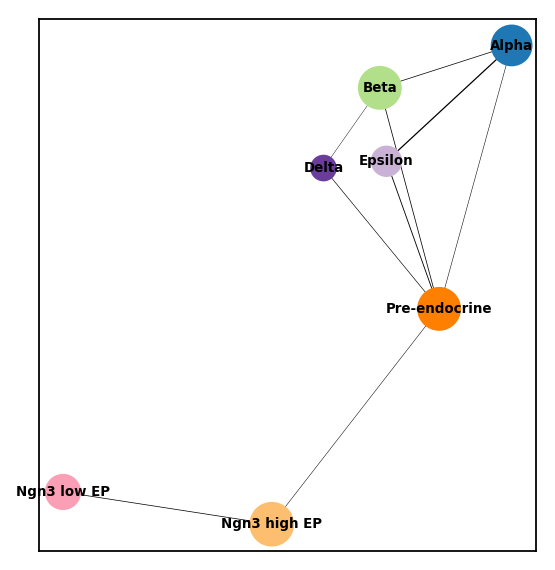

computing UMAP
    finished (0:00:17.27) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [203]:
sc.tl.paga(adata_hvg_15_endo,groups='clusters_fig6_broad_final')
pos=np.array([[ 2.9306967 , -3.69920318],
       [ 6.65329762, -4.24373418],
       [ 9.63597802, -0.6090208 ],
       [ 8.57965017,  3.12091193],
       [10.93007729,  3.83649912],
       [ 7.57528693,  1.76712885],
       [ 8.69834368,  1.88152097]])#,#endo
sc.pl.paga(adata_hvg_15_endo,edge_width_scale=0.2,threshold=0.11,pos=pos,fontsize=6,node_size_scale=2)
sc.tl.umap(adata_hvg_15_endo,init_pos='paga')

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/sophie.tritschler/miniconda3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:02.95) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
running partition-based graph abstraction (PAGA)
    finished (0:00:00.24) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


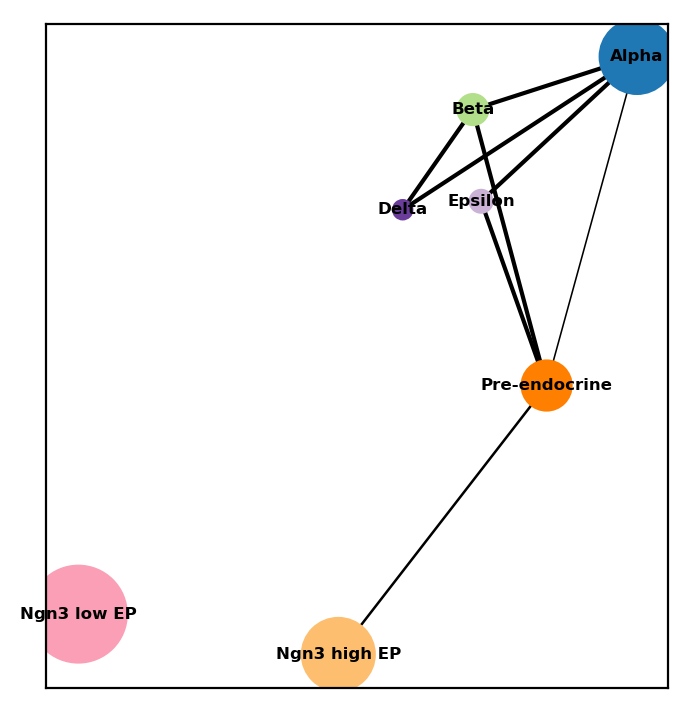

computing UMAP
    finished (0:00:07.64) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [210]:
adata_hvg_12_endo=adata_hvg_endo[np.isin(adata_hvg_endo.obs['day'],'12.5')].copy()
sc.pp.pca(adata_hvg_12_endo)
sc.pp.neighbors(adata_hvg_12_endo)
adata_hvg_12_endo.uns['clusters_fig6_broad_final']=colors_endo

sc.tl.paga(adata_hvg_12_endo,groups='clusters_fig6_broad_final')
pos=np.array([[ 2.9306967 , -3.69920318],
       [ 6.65329762, -4.24373418],
       [ 9.63597802, -0.6090208 ],
       [ 8.57965017,  3.12091193],
       [10.93007729,  3.83649912],
       [ 7.57528693,  1.76712885],
       [ 8.69834368,  1.88152097]])#,#endo
sc.pl.paga(adata_hvg_12_endo,edge_width_scale=0.2,threshold=0.11,pos=pos,fontsize=6,node_size_scale=2)
sc.tl.umap(adata_hvg_12_endo,init_pos='paga')



saving figure to file ./figures/umap_12_clusters_new.pdf


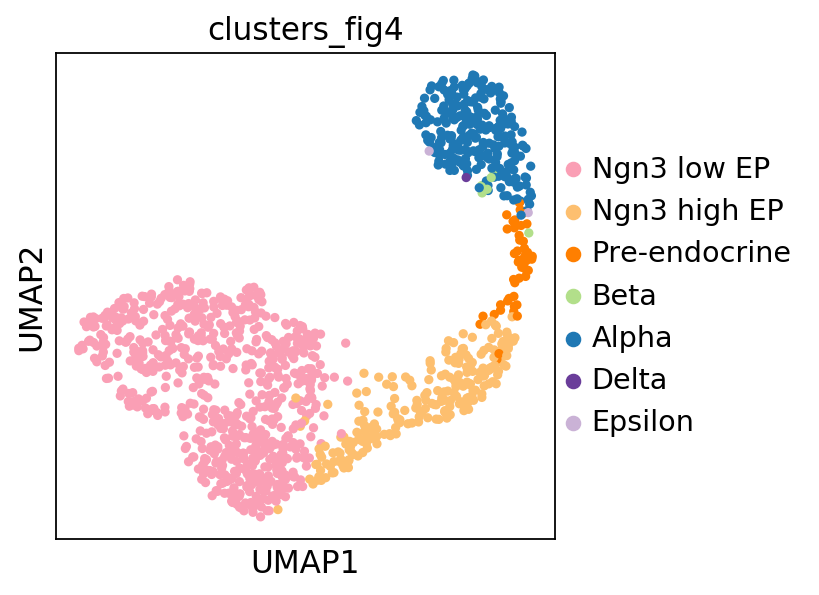

saving figure to file ./figures/umap_15_clusters_new.pdf


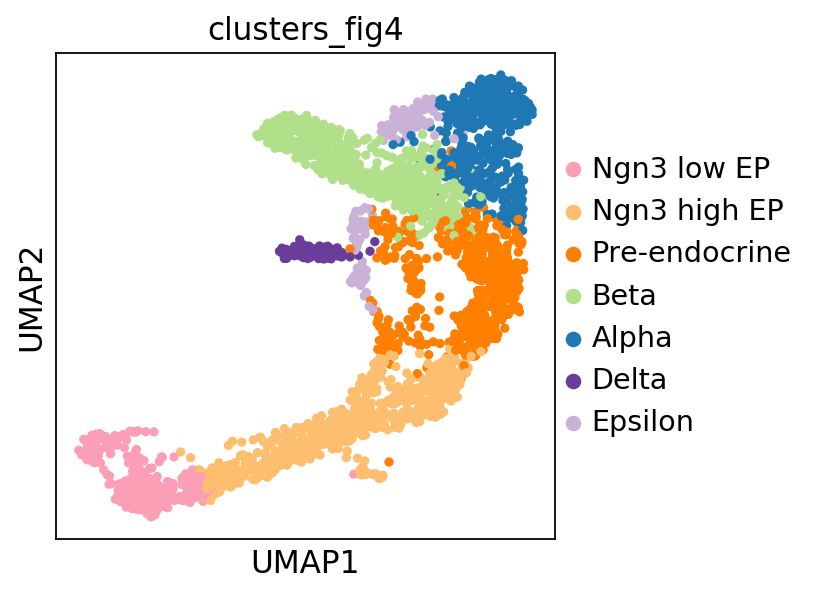

In [220]:
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=300,transparent=True)
sc.pl.umap(adata_hvg_12_endo,color='clusters_fig6_broad_final',size=40,save='_12_clusters_new.pdf',)
sc.pl.umap(adata_hvg_15_endo,color='clusters_fig6_broad_final',size=40,save='_15_clusters_new.pdf',)

### UMAP plots gene expression - Figure 6C-E

In [ ]:
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=300,transparent=True)


### alpha
gene='Slc38a5'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=7,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=7,save='_15_'+gene+'_new.pdf',size=40)

gene='Arx'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=4,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=4,save='_15_'+gene+'_new.pdf',size=40)

gene='Sct'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=4,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=4,save='_15_'+gene+'_new.pdf',size=40)


### beta
gene='Mafb'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=4,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=4,save='_15_'+gene+'_new.pdf',size=40)

gene='Meis2'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=4.5,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=4.5,save='_15_'+gene+'_new.pdf',size=40)

## Alpha cell subpopulation - Figure S4A,B

In [82]:
adata_alpha=adata_all[np.isin(adata_all.obs['clusters_fig6_alpha_final'],['primary Alpha','secondary Alpha'])].copy()

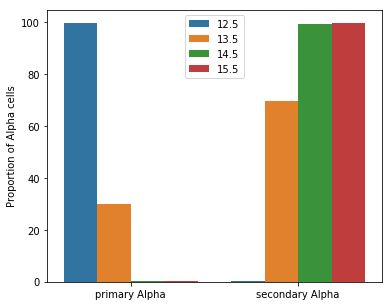

In [83]:
group='clusters_fig6_alpha_final'
df=pd.crosstab(columns=adata_alpha.obs[group],index=adata_alpha.obs['day'],normalize='index')
df=df.unstack().reset_index()
df=pd.DataFrame(df.values,columns=[group,'day','values'])
df['values']=df['values'].values*100

rcParams['figure.figsize'] = (6, 5)
ax = sns.barplot(x=group,y='values', hue="day", data=df,order=['primary Alpha','secondary Alpha'],
                    palette=adata_hvg.uns['day_colors'])

pl.xticks(rotation=0)
pl.xlabel('')
pl.ylabel('Proportion of Alpha cells')
ax.get_legend().set_title('')
ax.legend(loc='upper center')
pl.savefig('./alpha_proportions.pdf')
pl.show()

pl.rcParams.update(pl.rcParamsDefault)

In [85]:
labels=adata_alpha.obs['day'].cat.categories
colors=adata_alpha.uns['day_colors']

import matplotlib as mpl
fig = pl.figure(figsize=(2, 1.25))
patches = [
    mpl.patches.Patch(color=color, label=label)
    for label, color in zip(labels, colors)]
fig.legend(patches, labels, loc='center', frameon=False)
pl.show()

<Figure size 200x125 with 0 Axes>

In [ ]:
sc.tl.rank_genes_groups(adata_endo,groupby='clusters_fig6_alpha_final',groups=['primary Alpha'],reference='secondary Alpha')
sc.pl.rank_genes_groups(adata_endo,groups=['primary Alpha'],n_genes=30)

sc.tl.rank_genes_groups(adata_endo,groupby='clusters_fig6_alpha_final',groups=['secondary Alpha'],reference='primary Alpha')
sc.pl.rank_genes_groups(adata_endo,groups=['secondary Alpha'],n_genes=30)

In [86]:
genes=['Sct','Nkx6-2','Slc14a2','Gm11716','Gal','Igfbpl1','Cited1','Ly6h','Serpina1b','Basp1','Ftsj1','Meis2','Mafb',
       'Scgn','Chgb','Zbtb20','Glud1','Cd200','Smarca1','Chga','Fos','Jun','Junb']

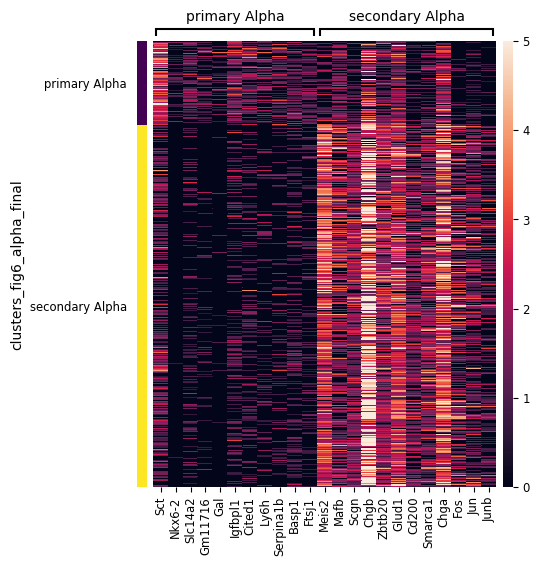

GridSpec(2, 3, height_ratios=[0.15, 6], width_ratios=[0.25, 8.75, 0.25])

In [87]:
sc.pl.heatmap(adata_alpha, genes, groupby='clusters_fig6_alpha_final', 
              var_group_positions=[(0, 10), (11, 22)], 
              var_group_labels=adata_alpha.obs['clusters_fig6_alpha_final'].cat.categories,
              var_group_rotation=False,vmax=5)

## Hetereogeneity in EP signature gene expression

### UMAP plots gene expression EP signature genes - Figure 7B-D

In [ ]:
gene='Neurog3'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=6,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=6,save='_15_'+gene+'_new.pdf',size=40)


### beta
gene='Neurod2'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=4,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=4,save='_15_'+gene+'_new.pdf',size=40)

gene='Sult2b1'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=3,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=3,save='_15_'+gene+'_new.pdf',size=40)

gene='Upk3bl'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=3,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=3,save='_15_'+gene+'_new.pdf',size=40)


### alpha
gene='Gm8773'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=5,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=5,save='_15_'+gene+'_new.pdf',size=40)

gene='Gng13'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=2,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=2,save='_15_'+gene+'_new.pdf',size=40)

gene='Steap1'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=3,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=3,save='_15_'+gene+'_new.pdf',size=40)
   
gene='Serpinf2'
sc.pl.umap(adata_hvg_12_endo,color=gene,vmin=0,vmax=4,save='_12_'+gene+'_new.pdf',size=40)
sc.pl.umap(adata_hvg_15_endo,color=gene,vmin=0,vmax=4,save='_15_'+gene+'_new.pdf',size=40)

### Dotplot EP signatures in Ngn3 high EP split per day - Figure 7A

In [546]:
adata_ngn3_hvg = adata_hvg[adata_hvg.obs['clusters_fig3_final'] == 'Ngn3 high EP'].copy()

In [555]:
## we scale the data for visualization
adata_ngn3_hvg_scaled=sc.pp.scale(adata_ngn3_hvg,copy=True,max_value=2,zero_center=False)

saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/dotplotep_signature_per_day_new.pdf


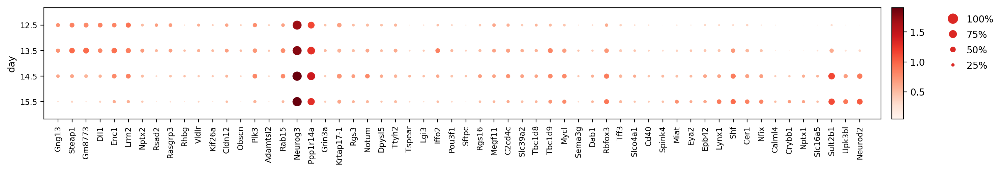

GridSpec(2, 4, height_ratios=[0, 10.5], width_ratios=[29.0, 0.4, 0.7, 0.5])

In [557]:
pl.rcParams.update(pl.rcParamsDefault)
genes=['Gng13','Steap1','Gm8773', 'Dll1','Enc1','Lrrn2','Nptx2','Rsad2','Rasgrp3','Rhbg','Vldlr','Kif26a','Cldn12','Obscn','Plk3',
'Adamtsl2','Rab15', 
'Neurog3','Ppp1r14a','Grin3a','Krtap17-1', 'Rgs3','Notum','Dpysl5','Ttyh2', 'Tspear','Lgi3','Iffo2', 'Pou3f1','Sftpc', 'Rgs16','Megf11', 'C2cd4c', 'Slc39a2','Tbc1d8','Tbc1d9','Mycl','Sema3g', 'Dab1',
'Rbfox3','Tff3','Slco4a1','Cd40','Spink4','Miat', 'Eya2','Epb42',
'Lynx1','Shf','Cer1','Nfix','Calml4','Crybb1', 'Nptx1', 'Slc16a5','Sult2b1','Upk3bl','Neurod2']
sc.pl.dotplot(adata_ngn3_hvg_scaled, genes, groupby='day',
              save='ep_signature_per_day_new.pdf')


### Dotplot EP signatures in Ngn3 high EP split per day - Figure S4C

In [726]:
adata_ngn3_low_hvg = adata_hvg[adata_hvg.obs['clusters_fig3_final'] == 'Ngn3 low EP'].copy()

In [738]:
adata_ngn3_low_hvg_scaled=sc.pp.scale(adata_ngn3_low_hvg,copy=True,max_value=1.5,zero_center=False)

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/scanpy/preprocessing/simple.py:1145: RuntimeWarning: divide by zero encountered in true_divide
  sparsefuncs.inplace_column_scale(X, 1/scale)


saving figure to file /Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/dotplotep_signature_per_day_EPlow_woNgn3.pdf


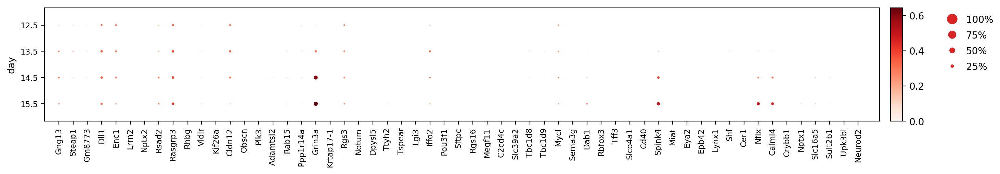

GridSpec(2, 4, height_ratios=[0, 10.5], width_ratios=[28.5, 0.4, 0.7, 0.5])

In [740]:
pl.rcParams.update(pl.rcParamsDefault)
sc.settings.figdir='/Users/sophie/Documents/ICB/Projects/2018_10X_Ngn3_Progenitors/Figures_revision/'
genes=['Gng13','Steap1','Gm8773', 'Dll1','Enc1','Lrrn2','Nptx2','Rsad2','Rasgrp3','Rhbg','Vldlr','Kif26a','Cldn12','Obscn','Plk3',
'Adamtsl2','Rab15',
'Ppp1r14a','Grin3a','Krtap17-1', 'Rgs3','Notum','Dpysl5','Ttyh2', 'Tspear','Lgi3','Iffo2', 'Pou3f1','Sftpc', 'Rgs16','Megf11', 'C2cd4c', 'Slc39a2','Tbc1d8','Tbc1d9','Mycl','Sema3g', 'Dab1',
'Rbfox3','Tff3','Slco4a1','Cd40','Spink4','Miat', 'Eya2','Epb42',
'Lynx1','Shf','Cer1','Nfix','Calml4','Crybb1', 'Nptx1', 'Slc16a5','Sult2b1','Upk3bl','Neurod2']
sc.pl.dotplot(adata_ngn3_low_hvg_scaled, genes, groupby='day',
              save='ep_signature_per_day_EPlow_woNgn3.pdf')

## Lineage tree inference (PAGA) - Figure 7F

In [693]:
adata_endo=adata_all[np.isin(adata_all.obs['clusters_fig6_fine_final'],['Ngn3 High early', 'Ngn3 High late',
       'Fev+ Beta', 'Beta', 'Fev+ Alpha', 
       'Alpha', 'Fev+ Pyy', 'Fev+ Delta',
       'Fev+ Epsilon', 'Delta', 'Epsilon'])].copy()
adata_endo_hvg=adata_hvg[np.isin(adata_all.obs['clusters_fig6_fine_final'],['Ngn3 High early', 'Ngn3 High late',
       'Fev+ Beta', 'Beta', 'Fev+ Alpha', 
       'Alpha', 'Fev+ Pyy', 'Fev+ Delta',
       'Fev+ Epsilon', 'Delta', 'Epsilon'])].copy()

In [694]:
## set positions for PAGA graph
pos=np.array([ 
       [ 7, -0.5 ],
       [ 7, 0.5],
       [9,  1 ],
       [11 ,  1],
       [ 9, -1],
       [ 11, -1],
       [9.5,  -1.5],
       [9.5,  0.5],
       [9.5, -0.5],
       [ 11,  0.5],
       [ 11,  -0.5]])

In [695]:
## reset color palette
adata_endo_hvg.uns['clusters_fig6_fine_final_colors']=[
       '#A0D4FF',                                          
       '#B1ECCB',
       '#9CD172',
       '#779F57',
       '#A0D4FF',
       '#1F75C3',
       '#CE6566',
       '#DD58E8',
       '#BEA3CE',
       '#6a3d9a',
       '#7C6A86']

running partition-based graph abstraction (PAGA)
    finished (0:00:00.99) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


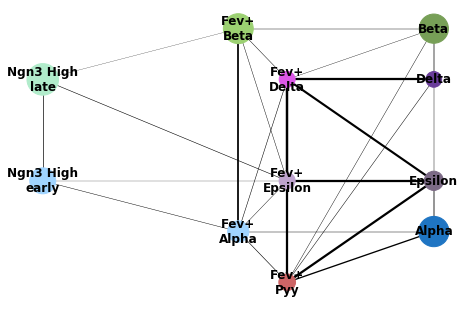

In [16]:
rcParams['figure.figsize'] = (7,5)
sc.tl.paga(adata_endo_hvg,groups='clusters_fig6_fine_final')
sc.pl.paga(adata_endo_hvg,edge_width_scale=0.3,fontsize=12,threshold=0.1,pos=pos,frameon=False,node_size_scale=3,
          labels=['Ngn3 High\nearly', 'Ngn3 High\nlate',
        'Fev+\nBeta',
       'Beta', 'Fev+\nAlpha', 'Alpha', 'Fev+\nPyy', 'Fev+\nDelta',
                  'Fev+\nEpsilon',
        'Delta', 'Epsilon'])

## Arx-Pax4 specification - Figure S4D

running partition-based graph abstraction (PAGA)
    finished (0:00:00.34) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


--> added 'pos', the PAGA positions (adata.uns['paga'])
saving figure to file ./figures/paga_endocrine_fig4_Pax.pdf


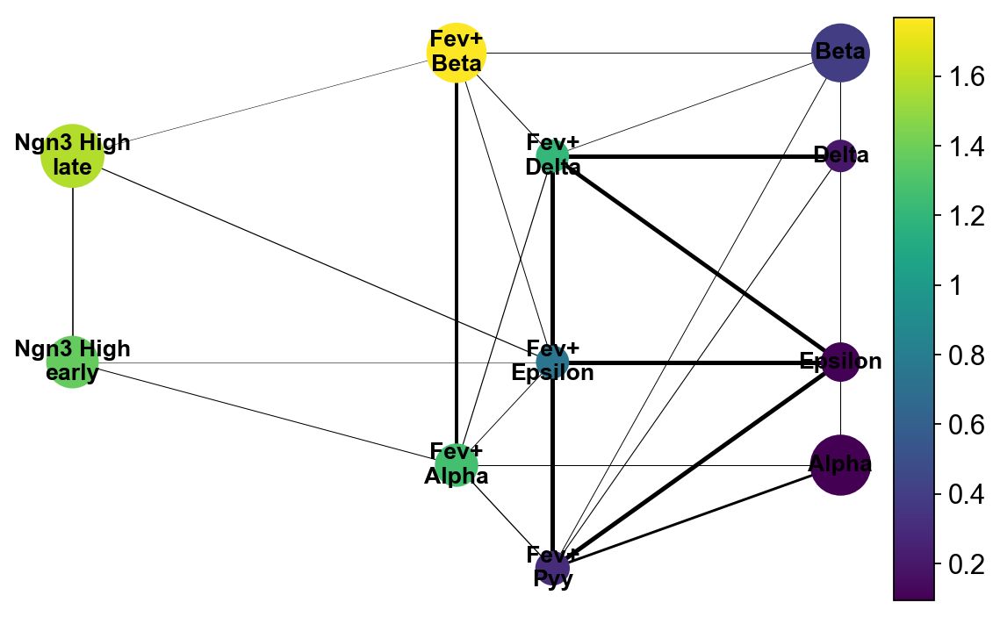

/Users/sophie/miniconda3/envs/scanpy_ngn3/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


--> added 'pos', the PAGA positions (adata.uns['paga'])


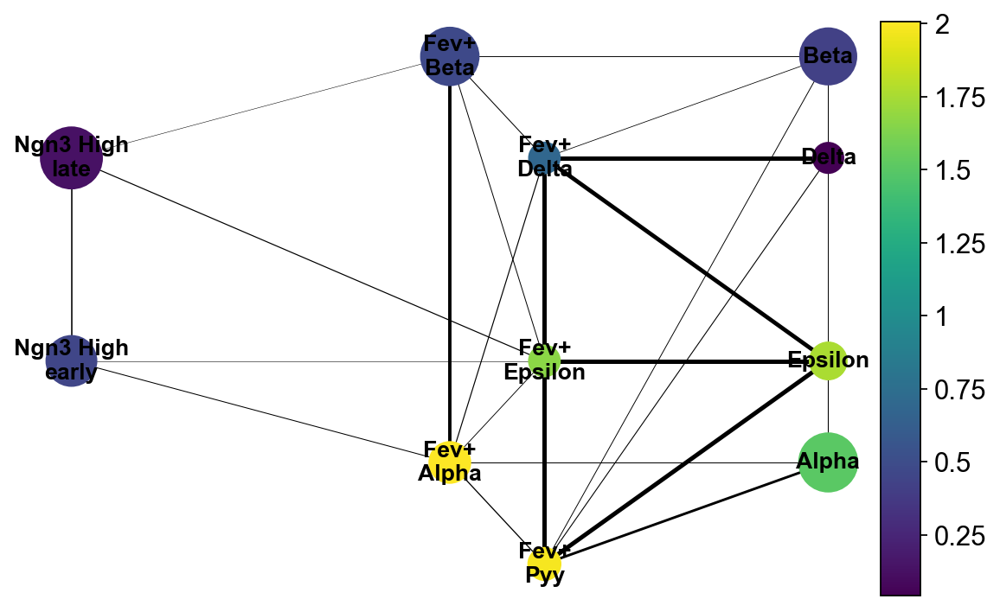

In [697]:
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=300,transparent=True)
rcParams['figure.figsize'] = (7,5)
sc.tl.paga(adata_endo_hvg,groups='clusters_fig6_fine_final')

## plot mean expression per cluster on PAGA graph
sc.pl.paga(adata_endo_hvg,color=['Pax4'],edge_width_scale=0.3,fontsize=12,threshold=0.1,pos=pos,frameon=False,node_size_scale=3,
          labels=['Ngn3 High\nearly', 'Ngn3 High\nlate','Fev+\nBeta','Beta', 'Fev+\nAlpha', 'Alpha',
                  'Fev+\nPyy', 'Fev+\nDelta','Fev+\nEpsilon','Delta', 'Epsilon'],save='_endocrine_fig4_Pax.pdf',text_kwds={'color':'black'})

sc.pl.paga(adata_endo_hvg,color=['Arx'],edge_width_scale=0.3,fontsize=12,threshold=0.1,pos=pos,frameon=False,node_size_scale=3,
          labels=['Ngn3 High\nearly', 'Ngn3 High\nlate','Fev+\nBeta','Beta', 'Fev+\nAlpha', 
                  'Alpha', 'Fev+\nPyy', 'Fev+\nDelta','Fev+\nEpsilon','Delta', 'Epsilon'])